# Hyperspectral Compressed Imaging Simulation
## Simulating detecting multiple light bands through Hadamard Masks

#### By João Galupa (2024)
#### Professor: André Moitinho

##### Based on: J. Silvestre (2019) Development of Sparse Coding and Reconstruction Subsystems for Astronomical Imaging, FCUL

For this notebook, we have the objective of walking over the multiple steps and fuctions needed to simulate the use of a compressed sensing (CS) device able to detect multiple wavelengths. Compressed sensing is a signal processing technique for efficiently acquiring and reconstructing a signal, exploting the sparcity of the signal in some base. In this case, by using Hadamard matrixes, we can detect a fraction of the signal and use it to reconstruct the original image with a small loss in accuracy. The device works by taking the image we want to detect and passing it through a digital micromirror device (DMD) where each mirror either reflects the signal to detector (1) or doesn't (0). We place on the DMD rows of the Hadamard matrix, which are linearly independent vectors, rescaled as a matrix with the resolution we want. Differente rows produce more information than others, so it's important to choose them wisely. It then adds up the signals and sends it through a prism, dividing the signal into different bands that are picked up with a CCD.

There should be taked into caution that in the notebook there will be a small difference with this process. Instead of for each DMD configuration, getting all the bands results, we reverse it, calculating for each band all the configuration. Besides a little reorganization of values, there should be no difference in the final result.

In [1]:
import IPython
import numpy as np
import scipy.linalg as sc
import matplotlib.pyplot as plt
import cv2
from sklearn.linear_model import Lasso
import numpy as np
from astropy.io import fits
import scipy as scipy
from sklearn.metrics import mean_squared_error
import spectral as sp
import spectral.io.envi as envi
from IPython.display import clear_output
from skimage import measure
from matplotlib.colors import LogNorm

### 2D tutorial

The images to work with should be squared and with size 2^n. We provide 3 images we different resolution. Besides the clarity that we can see each object, it only should change the time it takes to run most things. The reccomended size for an image with decent resolution and that shouldn't take too long to run is 64.

<Figure size 1000x300 with 0 Axes>

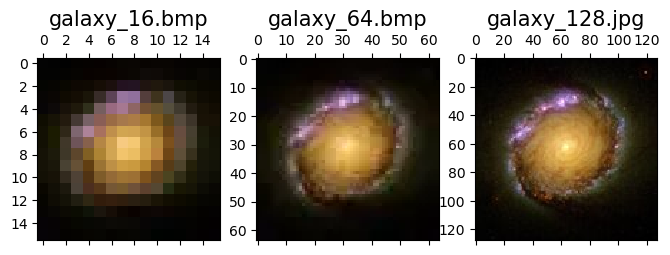

In [36]:
galaxys = ["galaxy_16.bmp", "galaxy_64.bmp", "galaxy_128.jpg"]

f = plt.figure(figsize=(10,3))
_, axs = plt.subplots(1, 3, figsize=(8,8)) 
for galaxy, ax in zip(galaxys, axs):
    galaxy_img = cv2.imread(galaxy)/255   # Read the image
    galaxy_img = galaxy_img[:,:,::-1]     # Invert to RGB instead of BGR
    ax.matshow(galaxy_img) 
    ax.set_title(galaxy, fontsize=15 )

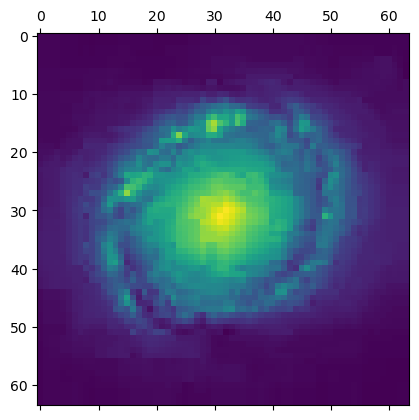

In [112]:
galaxy1 = cv2.imread("galaxy_64.bmp")/255
galaxy1 = galaxy1[:,:,1]
plt.matshow(galaxy1)

Firstly, we will use a 64×64 image with only one band, in this case, the green band and standardized to have values between 0 and 1. The image colour isn't related to the band but to the matshow function, using as default that colour pallet. An argument as “cmap='gray'" can be used to change for black and white.

We will now define the basic functions to create the Hadamard matrix and some reconfigurations in its rows order, understanding which one gives better results. We use the SciPy function “Hadamard” to create a Hadamard matrix with (64^2)x (64^2) since each row of that matrix should have the size of the image. The SciPy function creates the matrix with 1 and -1, but -1 isn't a good representation of weather the light was blocked or not, no we turn it into 0. 

We have four different reconfiguration for the Hadamard matrix:

Natural: Hadamard matrix has it was created, following the Sylvester's construction.

Random: Randomly ordered indices.

Walsh: Order by the number of times the value flips on each row. (We add one each time the next value in the row is different from the last)

Cake: Order by the number of same-label connected regions when the row is rescaled for the image size. (https://scikit-image.org/docs/stable/api/skimage.measure.html#skimage.measure.label, with connectivity = 1, so we don't consider diagonals). For example, if we have multiple vertical lines of 1s and 0s as the matrix, each line is a region.

In [41]:
def convert_hadamard(H):
    H[H == -1] = 0
    return H

In [42]:
def create_Hadamard(shape):
    h = np.array(sc.hadamard(shape**2))
    return convert_hadamard(h)

In [43]:
def reorder_random(H):
    indices = np.random.choice(len(H),len(H),replace=False)
    return H[indices], np.array(indices)

In [44]:
def reorder_Walsh(H):
    order = []
    for i,line in enumerate(H):
        cake_pieces = measure.label(line, return_num=True, connectivity=1)
        order.append([cake_pieces[1],i])
        
    order.sort()
    
    new_H = [H[j] for [i,j] in order]
    return np.array(new_H), np.array(order)[:,1]

In [45]:
def reorder_Cake(H):
    sh = int(np.sqrt(H.shape[0]))
    order = []
    for i,line in enumerate(H):
        cake_pieces = measure.label(line.reshape(sh,sh), return_num=True, connectivity=1)
        order.append([cake_pieces[1],i])
        
    order.sort()
    
    new_H = [H[j] for [i,j] in order]
    return np.array(new_H), np.array(order)[:,1]

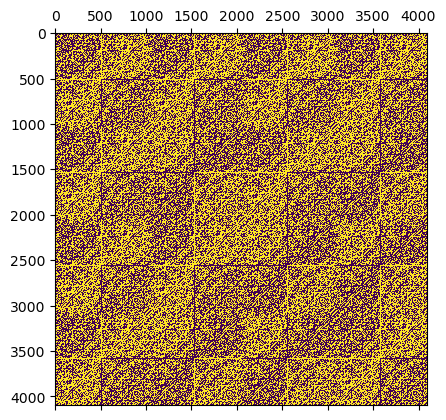

In [113]:
h = create_Hadamard(galaxy1.shape[0])
plt.matshow(h) 

We will start with 2D compressing, so we can test things easily. This method is then used in the 3D, but for each layer of the image (band of light). We start by doing element-wise multiplication of the Hadamard matrix with our image and then sum all those values. This results in a vector of values, each element representing a row of the Hadamard matrix. In a real detector, taking all these values would take as much time as getting each pixel of the image individually, so we wouldn't have any improvement. We should obtain only a percentage of those values and reconstruct the image with that.

We will use only the first fraction of the values calculated, and all the other values are replaced by the mean of the values we saved. Furthermore, we use the mean since we want to ignore the values with less information and these values are usually smaller. If we used the Hadamard matrix with 1s and -1s, the mean would end up close to 0, and we could replace the rest of the values with it. But with 1s and 0s, there is no negative signal, so we always end up with positive values.

In [47]:
def compressing_2D(image, h):
    image = np.array(image)
    x, y = image.shape
    size = x * y

    indices = np.arange(int(len(h)))
    
    image_2d = image.flatten()
    
    coefs = h @ image_2d
        
    return np.array(coefs), indices

In [48]:
def percentage_cut(y, percentage):
    size = len(y)
    cut  = int(size * percentage)
    new_y = y[:cut]
    mean = new_y[1:].mean()
    return np.append(new_y, [mean]*(size-cut))

In [112]:
# Uncomment different reorders to see effect on values cut
h = create_Hadamard(galaxy1.shape[0])
# h = reorder_random(h)[0]
# h = reorder_Walsh(h)[0]
# h = reorder_Cake(h)[0]

y, ind = compressing_2D(galaxy1, h)
cut_y = percentage_cut(y, 0.18)

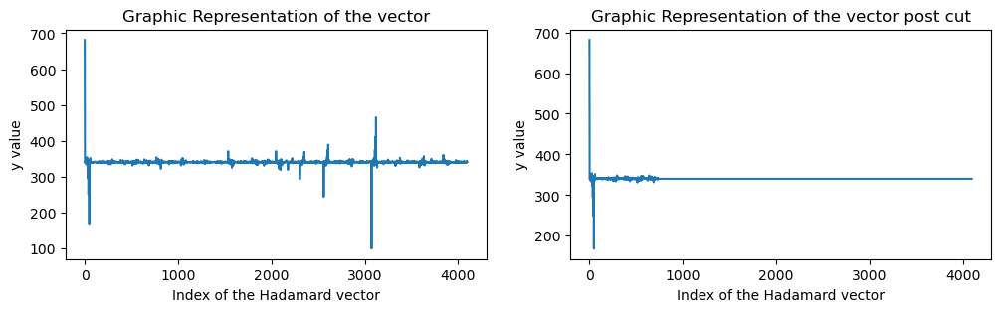

In [117]:
f = plt.figure(figsize=(12,3))
plt.subplot(121)
plt.plot(y)
plt.title("Graphic Representation of the vector", fontsize=12)
plt.xlabel('Index of the Hadamard vector', fontsize=10)
plt.ylabel('y value', fontsize=10)
plt.subplot(122)
plt.title("Graphic Representation of the vector post cut", fontsize=12)
plt.xlabel('Index of the Hadamard vector', fontsize=10)
plt.ylabel('y value', fontsize=10)
plt.plot(cut_y)

As we can see, in the case of the natural order, we lose too many values with information, that's with we should test other configuration.

For the reconstruction, we can apply a L1 regularization with Lasso. By taking the cut vector and Hadamard matrix used to create it, we can iterate over an initially random matrix with the size of the image. It iterates until it approximates to a matrix that, multiplied by the Hadamard, results in a vector as close to the given one as possible.

In [49]:
def l1_reconstruct(y, hadamard, alpha=0.01, max_iter = 10000, tol = 1e-4):
    lasso = Lasso(alpha=alpha, max_iter = max_iter, tol = tol)
    lasso.fit(hadamard,y)
    return lasso

In [50]:
def reconstructed_image(lasso):
    image = lasso.coef_
    size = int(np.sqrt(len(image)))
    image_final =  image.reshape(size,size)
    
    return image_final

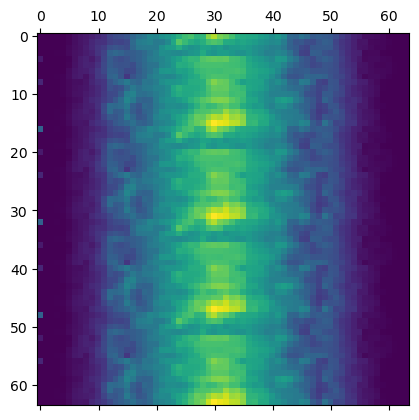

In [116]:
model = l1_reconstruct(cut_y, h)
final_image = reconstructed_image(model)
plt.matshow(final_image)

As we can see, by losing a lot of the information in the vector with the natural configuration, the reconstruction ends up a lot different to the original, not even being recognizable. If we up the percentage of the vector we save, the quality should go up too.

Next we define some utility functions to use latter to calculate the minimum squared error (MSE) and to print out images with useful information.

In [3]:
def MSE(orig, pred, verbosity = False):
    mse = mean_squared_error(orig, pred)
    if verbosity: print("MSE: ", mse)
    return mse

In [4]:
def show(images, titles, columns, fig_size = 8):
    _, axs = plt.subplots(int((len(images)/columns)+0.5), columns, figsize=(fig_size, fig_size)) #gridspec_kw={'wspace':-0.5, 'hspace':0.3})
    axs = axs.flatten()
    for img, title, ax in zip(images, titles, axs):
        ax.matshow(img) # ,cmap='gray'
        ax.set_title(title, fontsize=15 )
        if ax == int((len(images)/columns)+0.5):
            plt.colorbar()
    plt.show()

### Realistic Image and tests

We will try to apply these results for a more realistic image of the sky. We can use a FITS image, provided by professor André Moitinho, where we will cut a 128x128 chunck. The whole 1024x1024 image is a bit slow to calculate, and needs a bit quite a bit of ram to save the Hadamard matrix, but should be possible with those resources. Another way to do the whole image would be by apllying it to adjancent chuncks and joining them in the end.

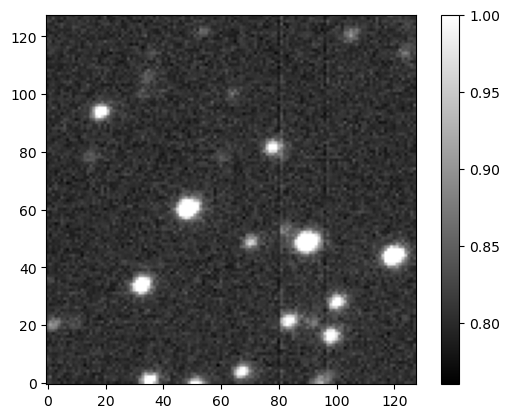

In [59]:
hdu_list = fits.open("C:/Users/galup/Desktop/Faculdade/2mestrado/1semestre/Eng_Teles_Satel/ccdDataETS/0_mainData/3241o.fits")
image_data = hdu_list[0].data
clipped_image_data = np.clip(image_data,0,600)[450:450+128,450:450+128]
stars_image = clipped_image_data/clipped_image_data.max()
plt.imshow(stars_image, cmap='gray', origin = 'lower')
plt.colorbar()

It's possible to spot some objects, possible stars, in the image and a bit of noite in the backgrounds.

We will then test the results for all the methods and some different cuts, in this case 10%, 18%, 25% and 50%.

In [88]:
def test_model(image, percentages, methods = "all", show_images = True):
    h = create_Hadamard(image.shape[0])
    
    h_random = reorder_random(h)[0]
    h_Walsh = reorder_Walsh(h)[0]
    h_Cake = reorder_Cake(h)[0]
    
    if methods == "all": methods = ["Normal","Random", "Walsh", "Cake"]
    
    images = []
    MSEs = []
    
    for met in methods:
        
        if met == "Random":
            hadamard = h_random
                
        elif met == "Walsh":
            hadamard = h_Walsh
                
        elif met == "Cake":
            hadamard = h_Cake
        
        else:
            hadamard = h
            
        y, ind = compressing_2D(image, hadamard) 
        for perc in percentages:
            new_y = percentage_cut(y, perc)
            model = l1_reconstruct(new_y, hadamard)
            images.append(reconstructed_image(model))
            MSEs.append(MSE(image,reconstructed_image(model)))
    
    if show_images:
        for i in images:
            i[0,0] = i[1:,1:].mean()
            
        show(np.array(images),[m+" MSE: "+str(n.round(5)) for m,n in zip([f'{i} with {int(100*j)}%' for i in methods for j in percentages],MSEs)],
             len(percentages),20)
        
    return images, MSEs

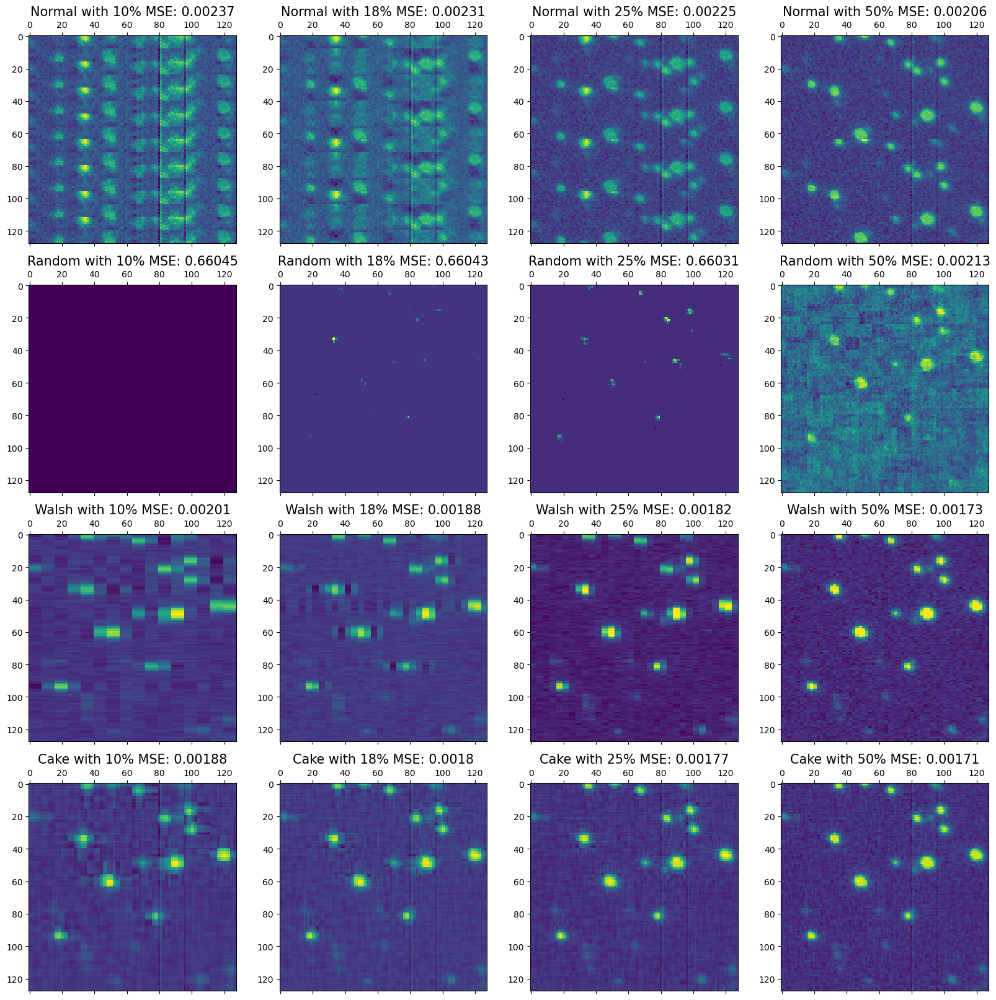

In [89]:
images, MSEs = test_model(stars_image, [0.10,0.18,0.25,0.50]) #,methods =  {to change the used methods} or # show_images = {For weather or not it should plot the images or only save them}

Text(0.5, 1.0, 'Original')

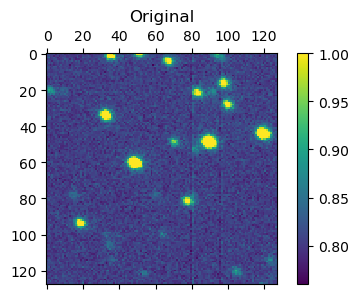

In [54]:
fig, ax = plt.subplots(figsize=(5,3))
a = ax.matshow(stars_image)
fig.colorbar(a, )
plt.title("Original")

We can clearly see that Cake, and the Walsh, are the ones that get the best results. We could also predict by looking at the vectors, where is clear that the values with more imbued information are in the beginning. From 18% and up we get images where we can make out most of the objects in the image, we only lose definition on the noise in the background, which isn't important. We can even spot some artefacts in the image, like the vertical lines. It's significant to note that colour intensity might not represent how close the images are. Since the matshow function of Matplotlib gets the highest and lowest values with the same intensity, possibly making one image look darker if it has one single pixel with a higher value.

The MSE isn't intuitive enough to measure how closely relate two images are, since its value depends on the value of the pixels. We can calculate the Pearson correlation coefficient, which goes from -1 to 1, to evaluate the images.

In [91]:
correls = [measure.pearson_corr_coeff(stars_image, image, mask=None)[0] for image in images]
methods = ["Normal","Random", "Walsh", "Cake"]
percentages = [0.10,0.18,0.25,0.50]
print("Pearson correlation coefficient of reconstructed image with the original:\n")
_ = [print("%s: %.3f"%(m,cor)) for m,cor in zip([f'{i} with {int(100*j)}%' for i in methods for j in percentages],correls)] 

Pearson correlation coefficient of reconstructed image with the original:

Normal with 10%: 0.336
Normal with 18%: 0.436
Normal with 25%: 0.514
Normal with 50%: 0.703
Random with 10%: nan
Random with 18%: 0.241
Random with 25%: 0.467
Random with 50%: 0.646
Walsh with 10%: 0.742
Walsh with 18%: 0.843
Walsh with 25%: 0.883
Walsh with 50%: 0.946
Cake with 10%: 0.842
Cake with 18%: 0.895
Cake with 25%: 0.918
Cake with 50%: 0.956


C:\Users\galup\anaconda3\lib\site-packages\skimage\measure\_colocalization.py:96: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  return pearsonr(image0, image1)


It's impressive how using Cake, we can get 0.9 of correlation using only 18% of the measurements.

With these, we are ready to start applying these for different light bands. As explained before, the methodology is the same, but now we do it for the various layers an image can have. We will also define a pipeline just to streamline the process, but it should be able to run the same way yhe 2D does, with a speacial attention to the fact we have multiple vectores for each band now.

In [6]:
def compressing_3D(image,percentage, h):
    image = np.array(image)
    x, y, dimesions = image.shape
    size = x * y
    
    
    coefs = []
    for dim in range(dimesions):
        
        print("Dim:", dim)
        clear_output(wait=True)
        
        image_2d = image[:,:,dim].flatten()
        
        y = h @ image_2d   
        coef = percentage_cut(y, percentage)
        
        coefs.append(np.array(coef))
        
    return np.array(coefs), h

In [7]:
def pipeline_3D(image, percentage, h):
    ys, hadamard = compressing_3D(image, percentage, h)
    pre_finals = []
    
    for i, y in enumerate(ys):
        print("Reconstructing Dim: ",i)
        clear_output(wait=True)
        
        model = l1_reconstruct(y, hadamard)
        pre_final = reconstructed_image(model)
        pre_finals.append(pre_final.flatten())
    
    print("Finishing")
    final = []
    for i in range(pre_finals[0].size):
        final.append([row[i] for row in pre_finals])
    
    print("Finished")
    size = int(np.sqrt(len(pre_finals[0])))
    return np.array(final).reshape(size,size,len(pre_finals)), ys

We will start again with the galaxy image, before jumping to a real world example. But this time, we use all three colour channels, the RGB, and we up the resolution of the image to 128x128.

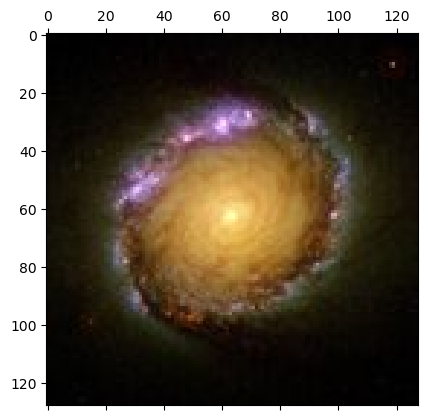

In [52]:
galaxy = cv2.imread("galaxy_128.jpg")/255
galaxy = galaxy[:,:,::-1]
plt.matshow(galaxy)

In [53]:
h = create_Hadamard(galaxy.shape[0])
h_Cake = reorder_Cake(h)[0]

In [54]:
final, ys = pipeline_3D(galaxy,0.35,h_Cake)

Finishing
Finished


We follow the same steps as before, but now using the pipeline function, just to organize things a bit better. 

After getting the image, we need to use a little trick. This method tends to make the first (top left) pixel equal to 0, which is mostly a problem that only affects the function to show the image plt.matshow. Since the real minimum value of the image might not be zero, this would make the whole image look brighter in comparison. For other tools, it might not be an issue, and a single pixel shouldn't impact the final image we want to retrieve. But to fix it, nonetheless, we will equal the first pixel to mean of its surroundings. 

In [102]:
for i in range(final.shape[2]):
    final[0,0,i] = (final[:10,:10,i].flatten()[1:]).mean()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


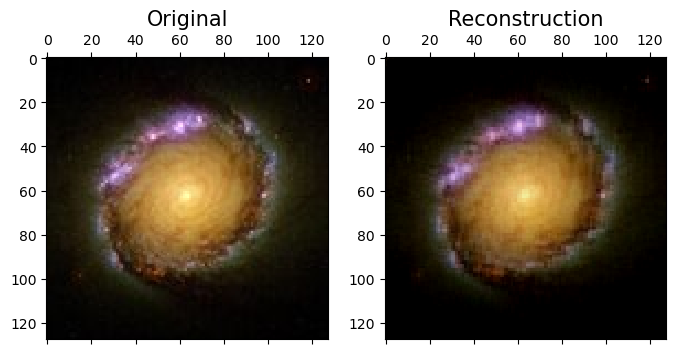

In [103]:
show([galaxy[:,:,:],final[:,:,:]], ["Original","Reconstruction"], columns = 2)

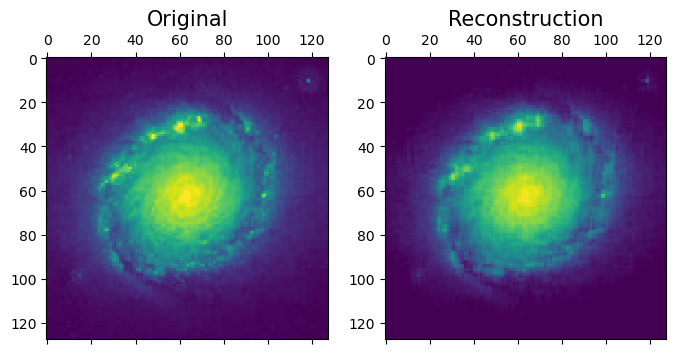

MSE:  0.0015564829075727234
Pearson correlation coefficient:  0.9970866898927517


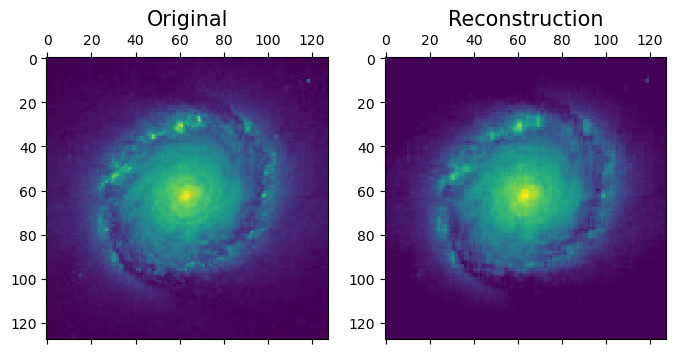

MSE:  0.0014419847850240131
Pearson correlation coefficient:  0.9946884195683039


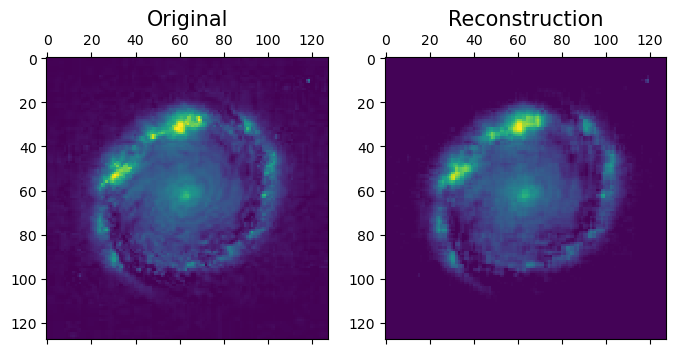

MSE:  0.0011270249230815371
Pearson correlation coefficient:  0.9894738493102815


In [92]:
for i in range(final.shape[2]):
    show([galaxy[:,:,i],final[:,:,i]], ["Original","Reconstruction"], columns = 2)
    MSE(galaxy[:,:,i],final[:,:,i], True)
    print("Pearson correlation coefficient: ", measure.pearson_corr_coeff(galaxy[:,:,i],final[:,:,i], mask=None)[0])

Finally, we apply all the steps we did before, but in a real spectrogram. For the lack of night sky spectrograms, we will use a popular free-to-use image of Earth: 92AV3C.lan. This image has 145 by 145 pixels with 220 different bands of light captured. We will cut a 64x64 chuck and apply the algorithm. 

Text(0.5, 1.0, 'First Layer')

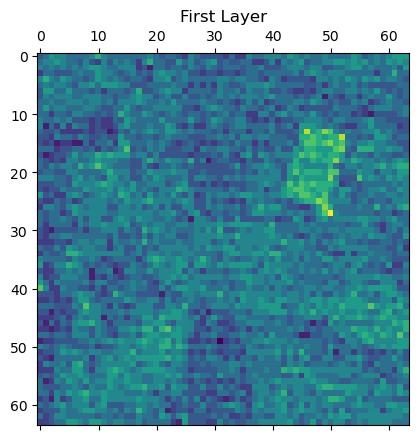

In [99]:
img_raw = sp.open_image('C:/Users/galup/Desktop/Faculdade/2mestrado/1semestre/modelacao/Projeto/92AV3C.lan')
img_new = np.array(img_raw.load())
img_max = img_new.max()
img = img_new[:64,:64]/img_max
plt.matshow(img[:,:,0])
plt.title("First Layer")

In [96]:
h = create_Hadamard(img.shape[0])
h_Cake = reorder_Cake(h)[0]

In [97]:
final, ys = pipeline_3D(img,0.25,h_Cake)

Finishing
Finished


In [103]:
_ = MSE(img.flatten(),final.flatten(), True)

MSE:  0.0017568749494793908


In [109]:
print("Pearson Correlation Coeff: %.4f"%measure.pearson_corr_coeff(img, final, mask=None)[0])

Pearson Correlation Coeff: 0.9974


In [106]:
for i in range(final.shape[2]):
    final[0,0,i] = (final[:10,:10,i].flatten()[1:]).mean()

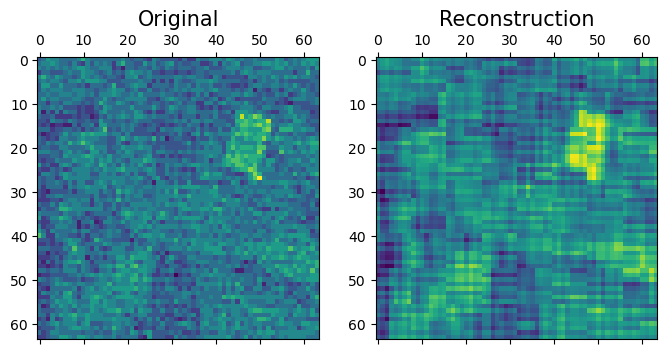

MSE:  0.0018270933634366414
Pearson correlation coefficient:  0.7415085044609864


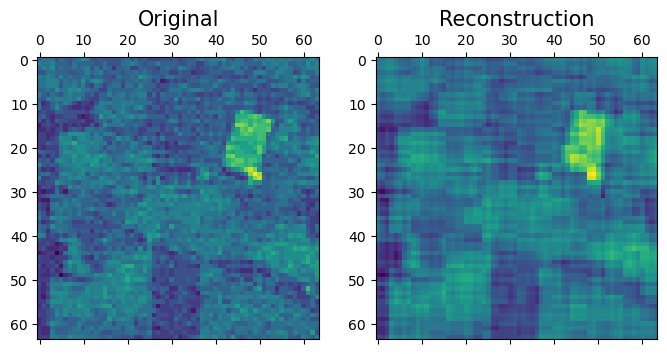

MSE:  0.0017661298355466618
Pearson correlation coefficient:  0.8478947688527015


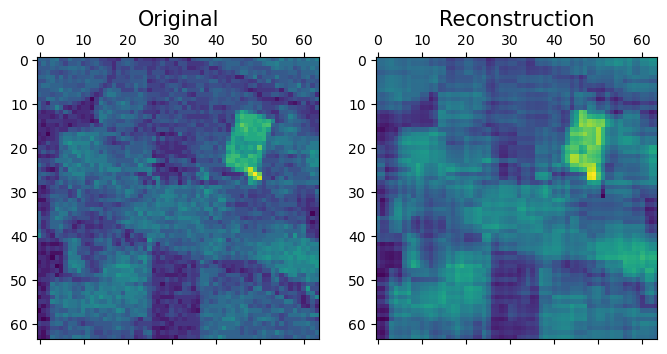

MSE:  0.0017484867562890024
Pearson correlation coefficient:  0.8941953526358726


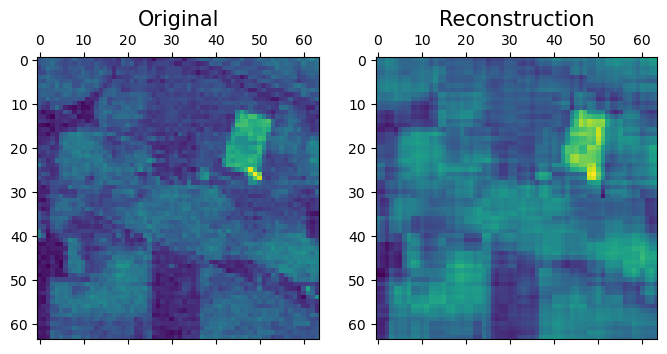

MSE:  0.0017385352910628464
Pearson correlation coefficient:  0.9145690144363872


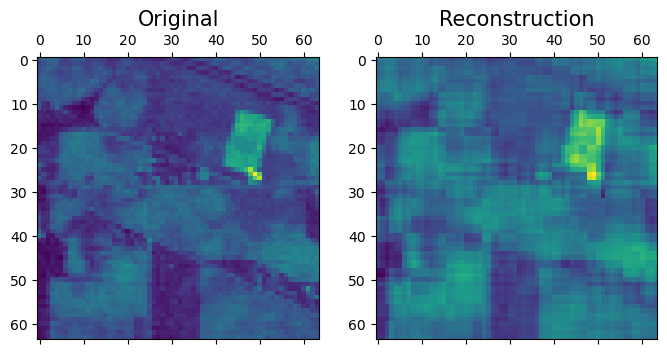

MSE:  0.0017700939877623324
Pearson correlation coefficient:  0.9292289699331987


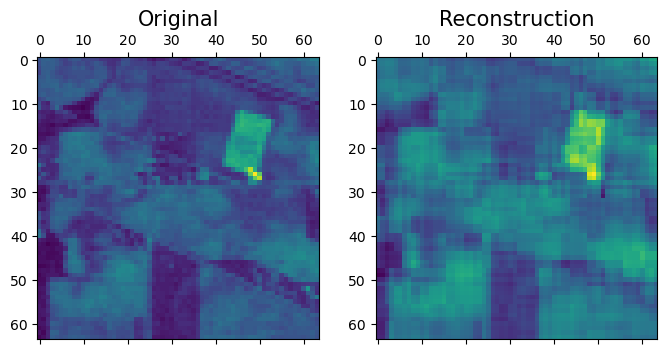

MSE:  0.0018249375238425397
Pearson correlation coefficient:  0.9355093826141045


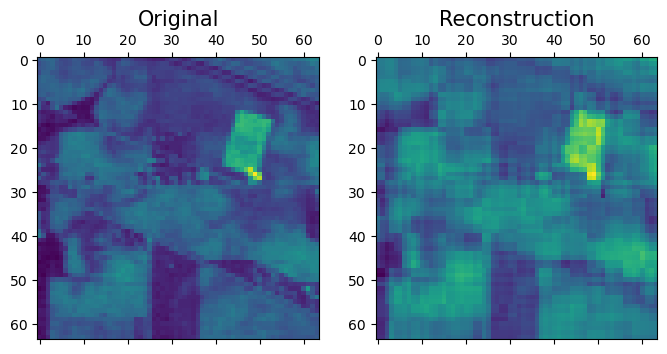

MSE:  0.001864403926906775
Pearson correlation coefficient:  0.9395769849688644


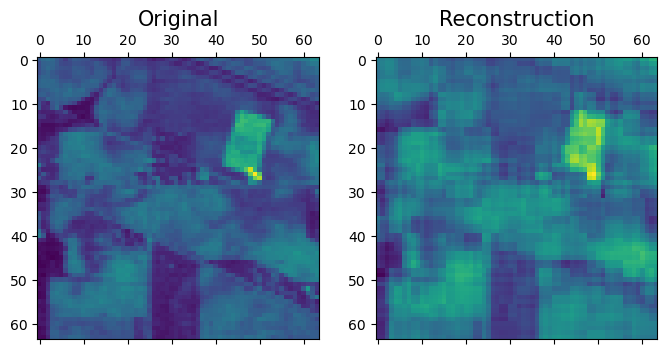

MSE:  0.001882145673248244
Pearson correlation coefficient:  0.9406029434277409


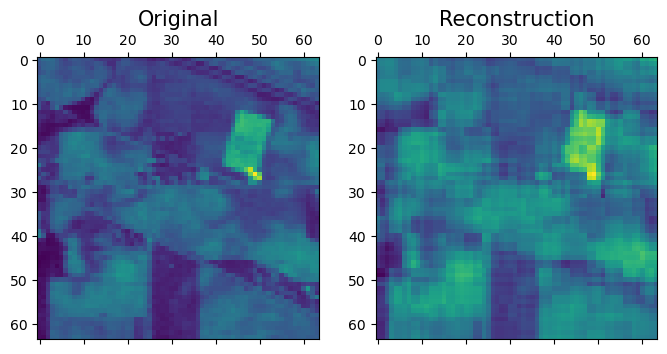

MSE:  0.00190876387784962
Pearson correlation coefficient:  0.9432018046267869


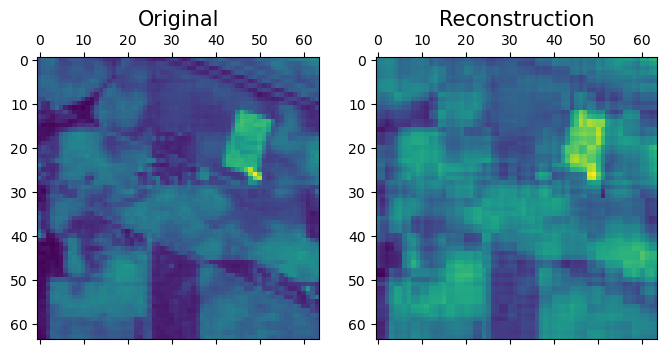

MSE:  0.0019070428876590613
Pearson correlation coefficient:  0.9446351440422474


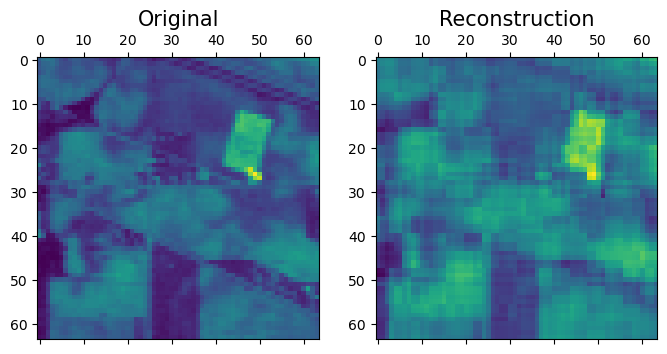

MSE:  0.0019427985025197905
Pearson correlation coefficient:  0.9465594616388457


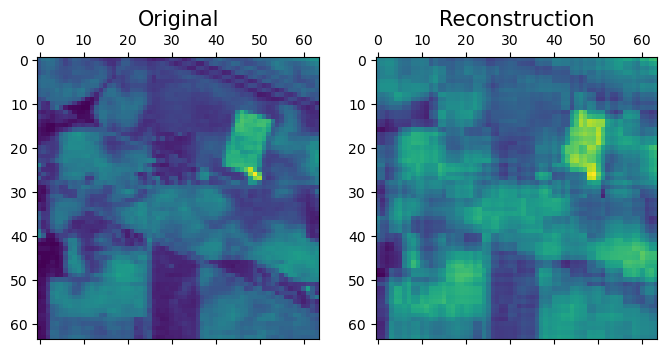

MSE:  0.0019573761875800676
Pearson correlation coefficient:  0.9476491903164515


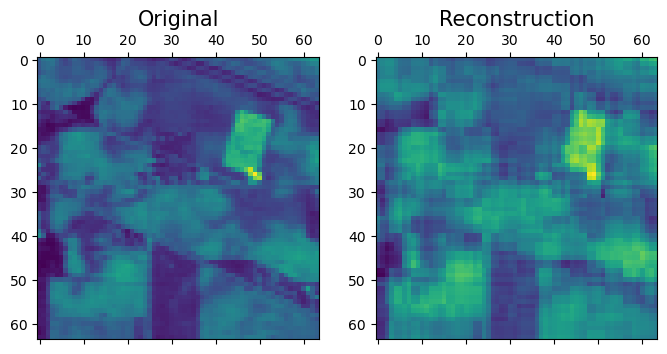

MSE:  0.001940571913144085
Pearson correlation coefficient:  0.9481753475889916


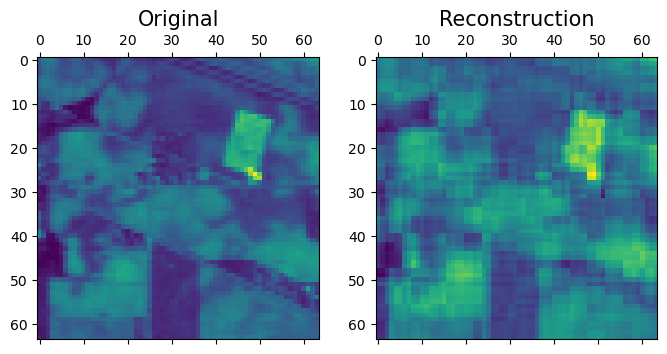

MSE:  0.001971808696645843
Pearson correlation coefficient:  0.9477560737059578


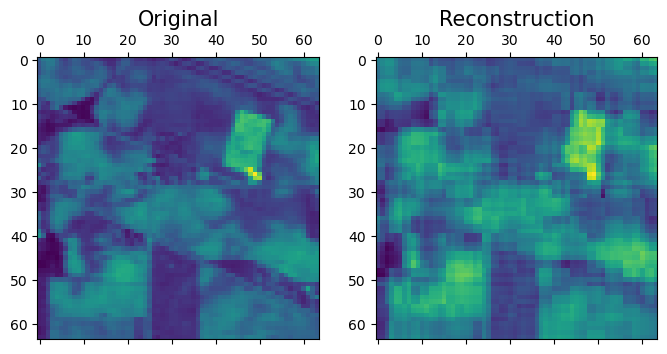

MSE:  0.001990466535117875
Pearson correlation coefficient:  0.9481649990111035


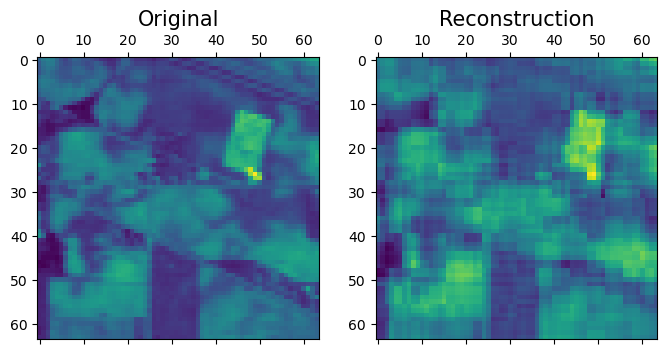

MSE:  0.0020092080502036925
Pearson correlation coefficient:  0.9488053068089775


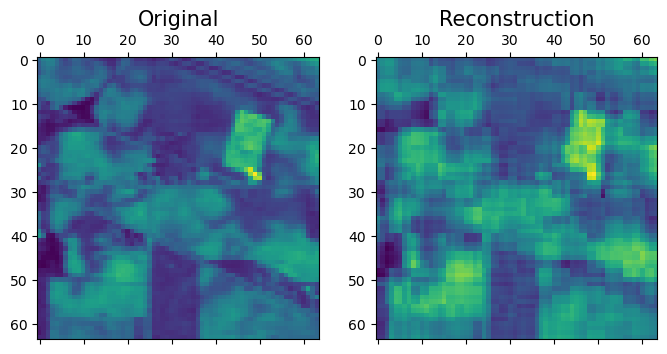

MSE:  0.002022702813579854
Pearson correlation coefficient:  0.9494869849159603


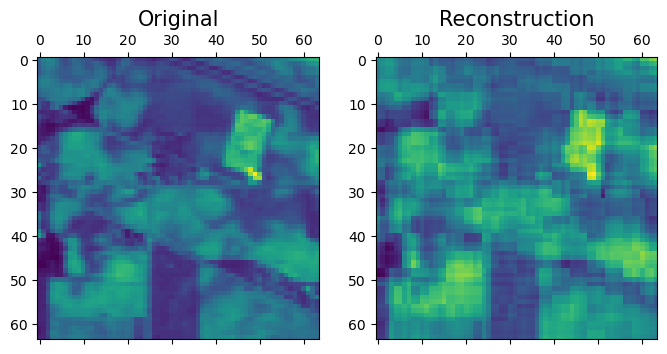

MSE:  0.00202964452572943
Pearson correlation coefficient:  0.9516366989316359


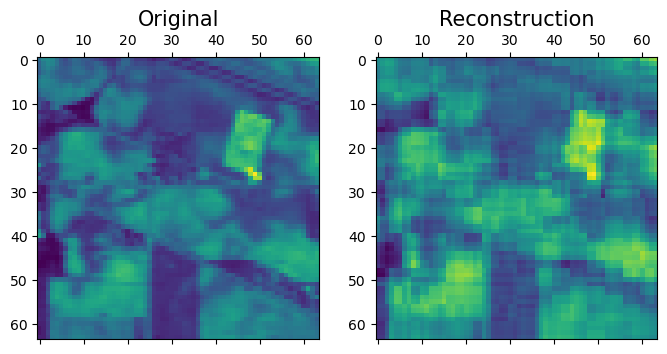

MSE:  0.002063889063013133
Pearson correlation coefficient:  0.9528315504026315


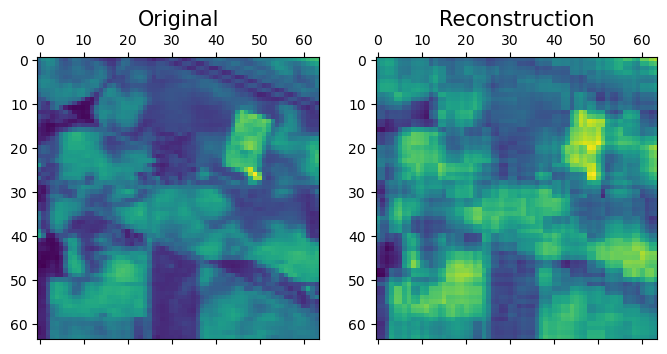

MSE:  0.0020846715882962214
Pearson correlation coefficient:  0.9541357839734251


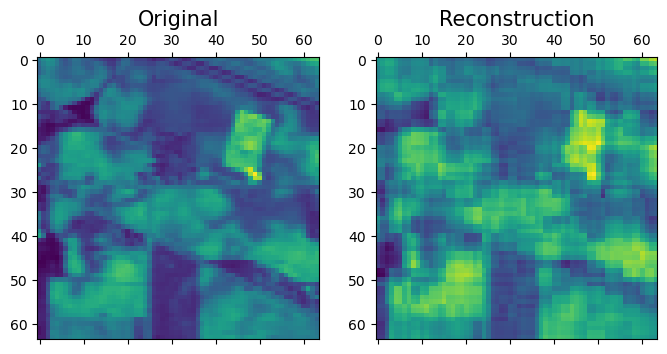

MSE:  0.00211444918973442
Pearson correlation coefficient:  0.9545184696710756


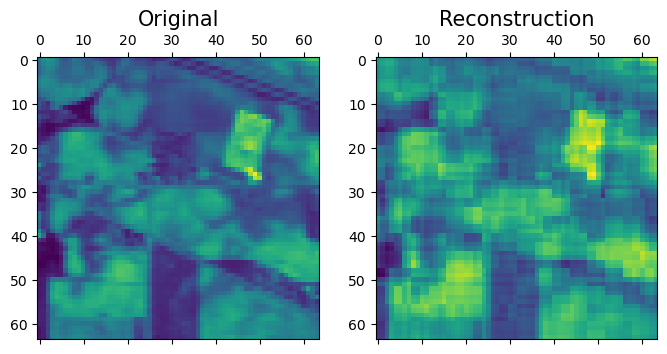

MSE:  0.0021526643083563807
Pearson correlation coefficient:  0.9552853448853476


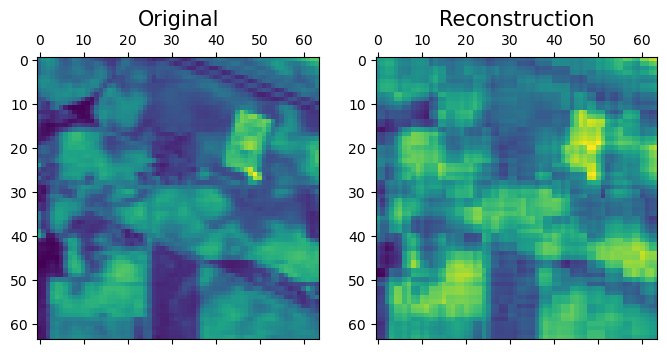

MSE:  0.002167586340422265
Pearson correlation coefficient:  0.9561442193251293


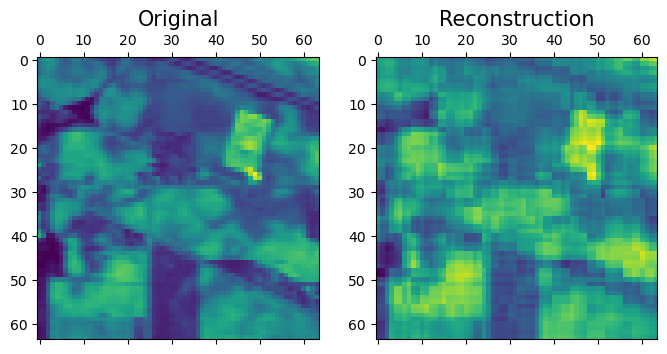

MSE:  0.002165833531248314
Pearson correlation coefficient:  0.9568162334945087


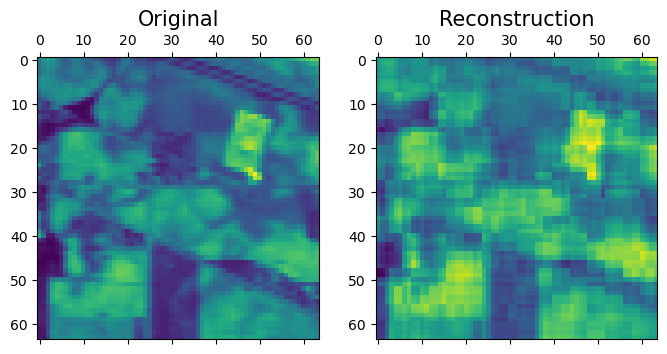

MSE:  0.002204026320159892
Pearson correlation coefficient:  0.9570430858346342


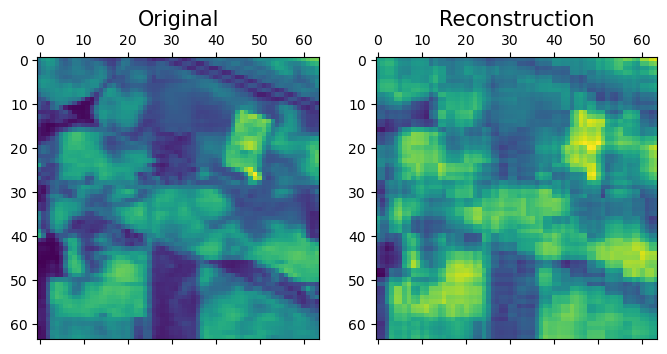

MSE:  0.002214262925020232
Pearson correlation coefficient:  0.9579030229825618


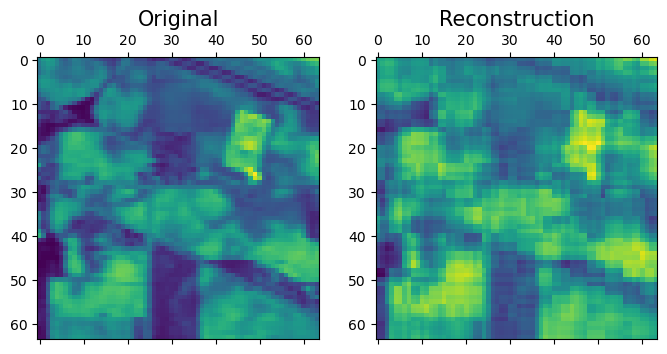

MSE:  0.0022033123755841864
Pearson correlation coefficient:  0.958314154534381


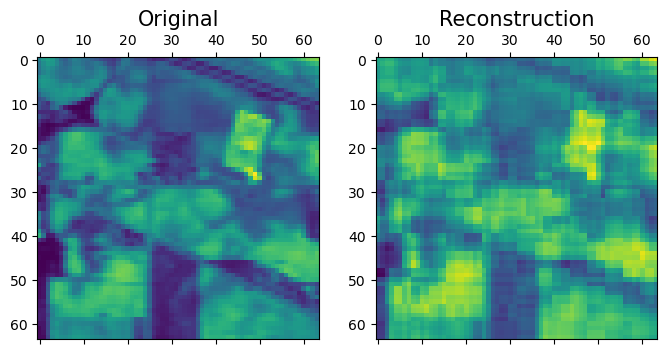

MSE:  0.002273555320129356
Pearson correlation coefficient:  0.9589609126100775


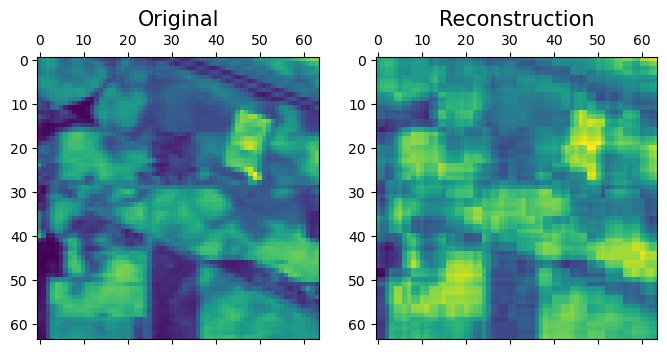

MSE:  0.002280847419086073
Pearson correlation coefficient:  0.9596074658468947


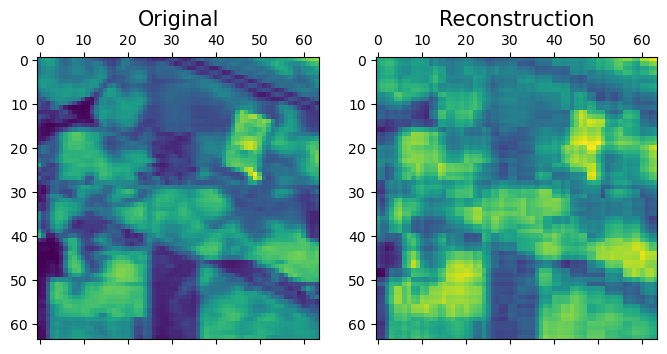

MSE:  0.0021524269132520034
Pearson correlation coefficient:  0.9593551799385363


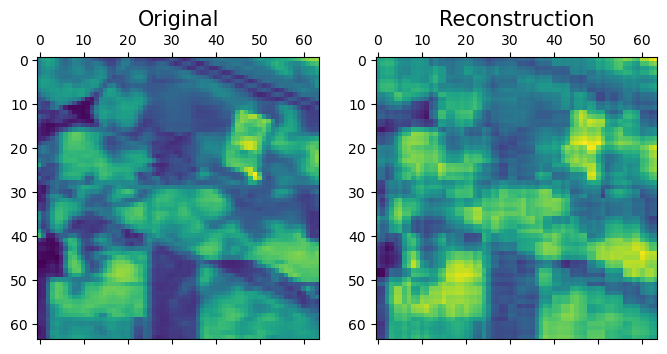

MSE:  0.002097146063115311
Pearson correlation coefficient:  0.9591115030643711


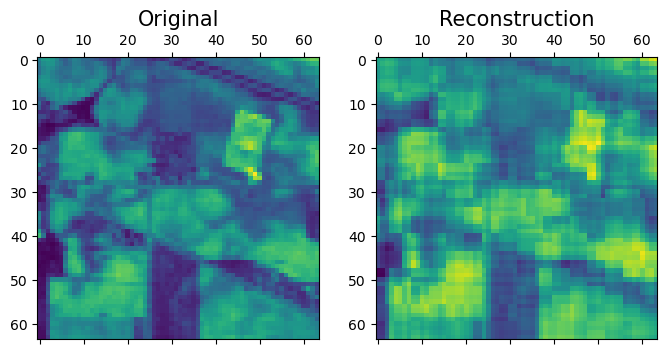

MSE:  0.0022493431226359977
Pearson correlation coefficient:  0.9519003039452836


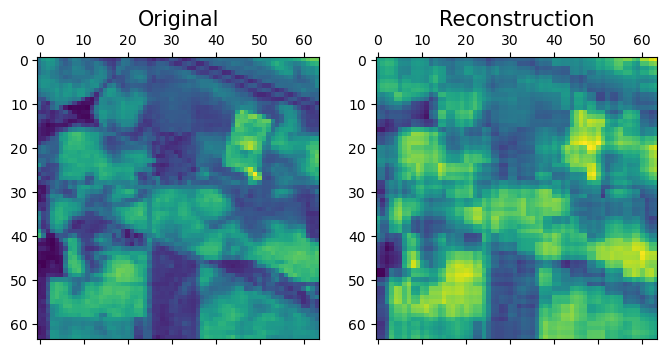

MSE:  0.002221564909968312
Pearson correlation coefficient:  0.9508939836815865


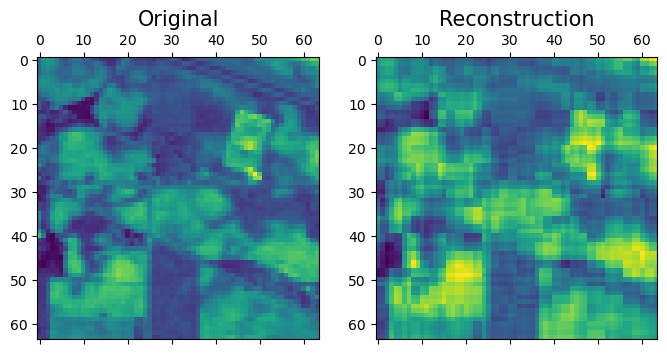

MSE:  0.002143047837376801
Pearson correlation coefficient:  0.9470938025221226


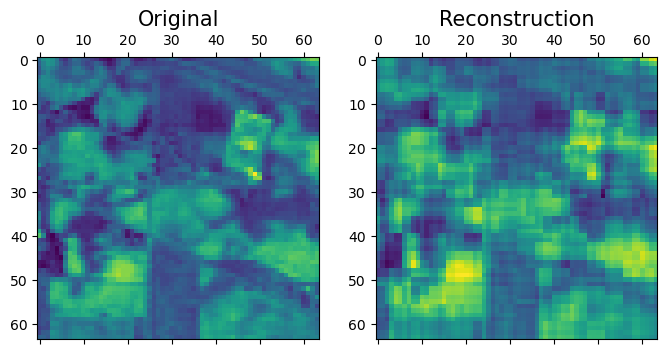

MSE:  0.0019846407246026207
Pearson correlation coefficient:  0.9413197711903721


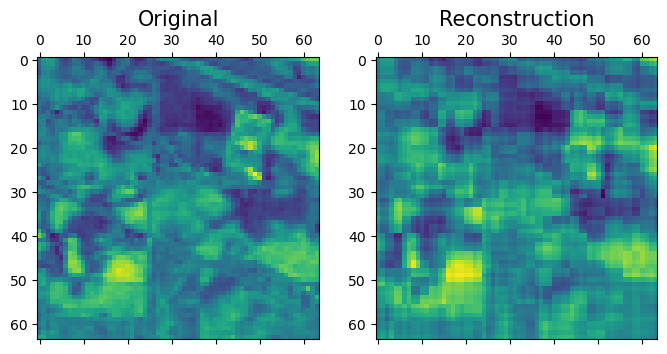

MSE:  0.0018962356429458819
Pearson correlation coefficient:  0.9312258150923045


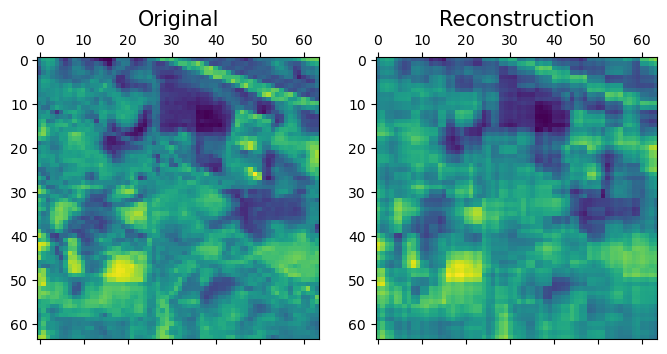

MSE:  0.0020163002788071687
Pearson correlation coefficient:  0.926076182787142


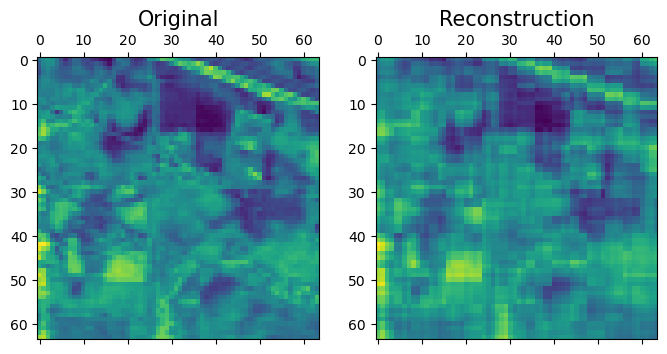

MSE:  0.0021575060280543306
Pearson correlation coefficient:  0.9264296923606071


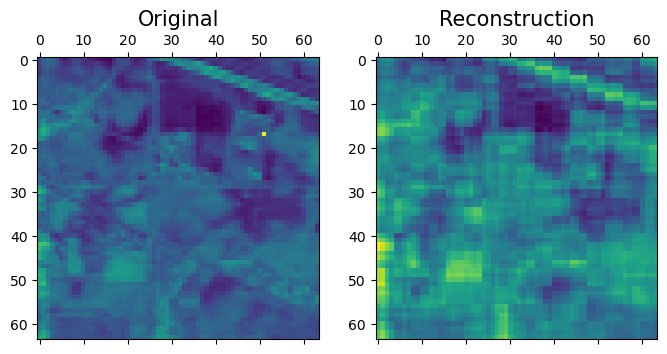

MSE:  0.002207358897087646
Pearson correlation coefficient:  0.923650100824148


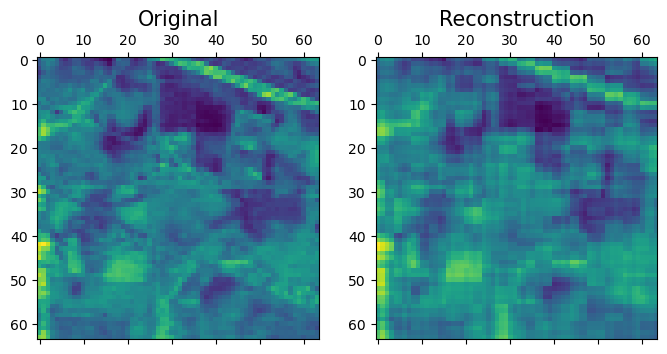

MSE:  0.0018386357302497618
Pearson correlation coefficient:  0.9273239991469591


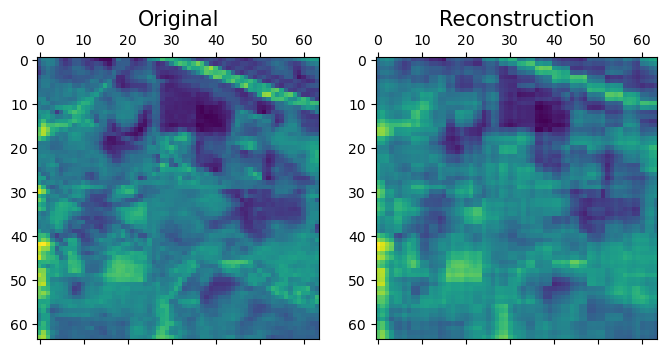

MSE:  0.002202989532173092
Pearson correlation coefficient:  0.9297139885577153


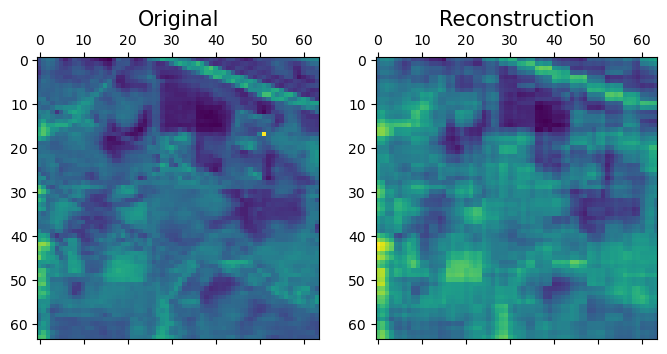

MSE:  0.0022521366862810425
Pearson correlation coefficient:  0.9267970423922806


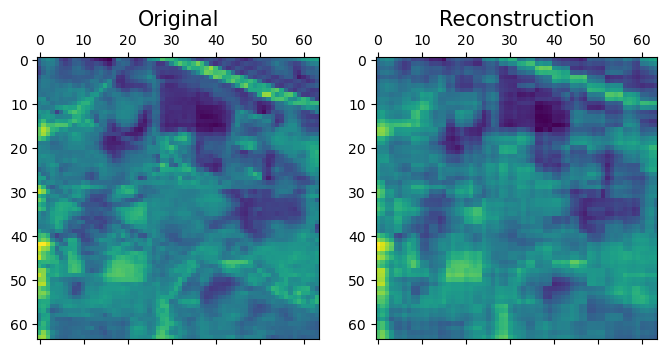

MSE:  0.0021469373967196803
Pearson correlation coefficient:  0.9309498774612415


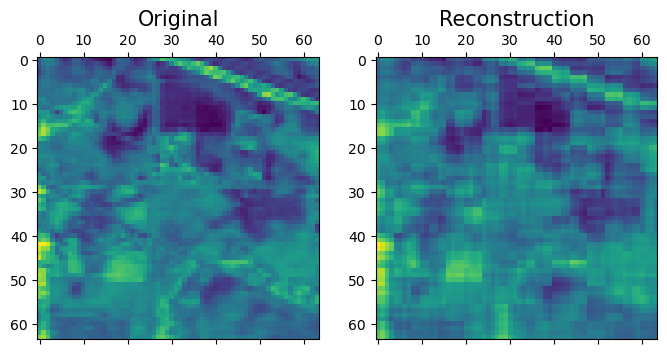

MSE:  0.002124833352571106
Pearson correlation coefficient:  0.930252702808204


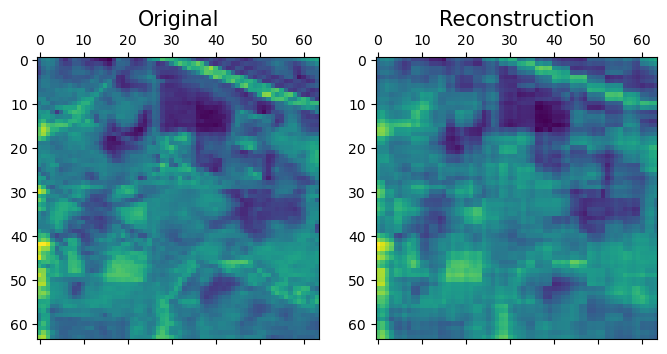

MSE:  0.002032038497308153
Pearson correlation coefficient:  0.9310528322597137


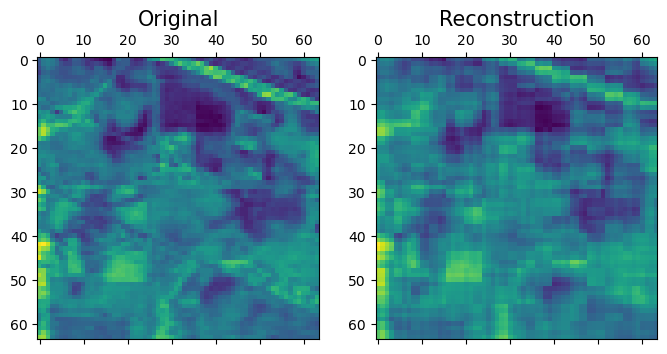

MSE:  0.0019407858710564579
Pearson correlation coefficient:  0.9309515641779468


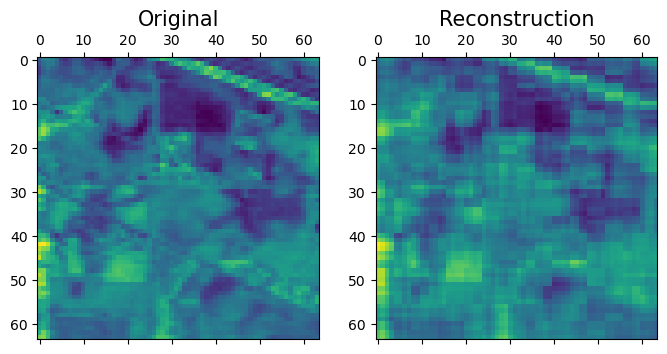

MSE:  0.0019898596166634365
Pearson correlation coefficient:  0.9310162420899865


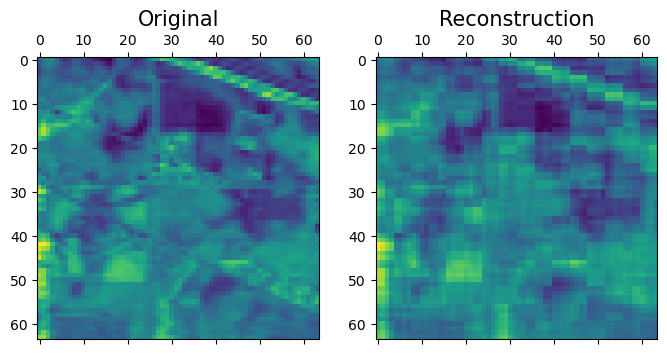

MSE:  0.0020571636892278266
Pearson correlation coefficient:  0.9318587294315843


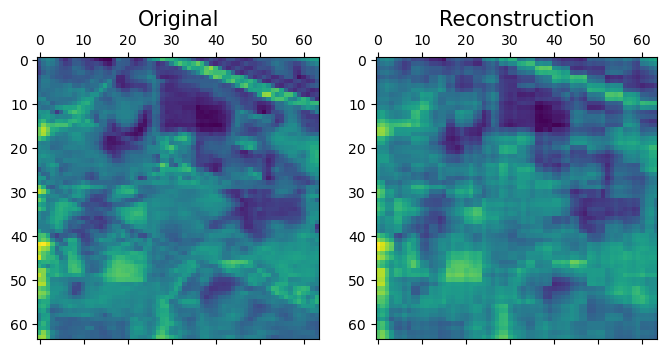

MSE:  0.0020363220434225352
Pearson correlation coefficient:  0.9322001556859515


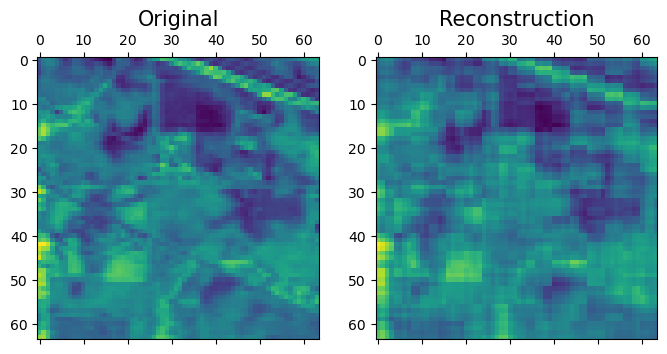

MSE:  0.0020293519799974564
Pearson correlation coefficient:  0.9322707507609131


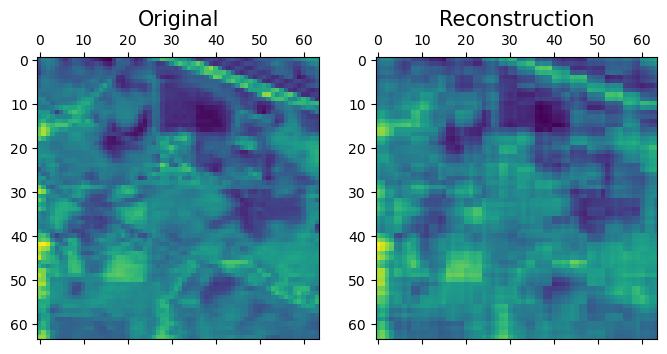

MSE:  0.002013010895093288
Pearson correlation coefficient:  0.9325969718896742


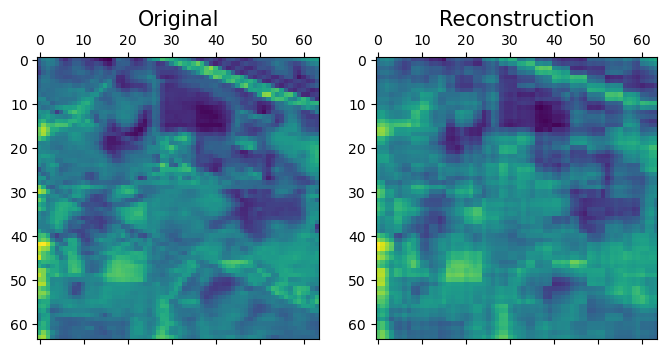

MSE:  0.0020083325598662482
Pearson correlation coefficient:  0.9332963944688237


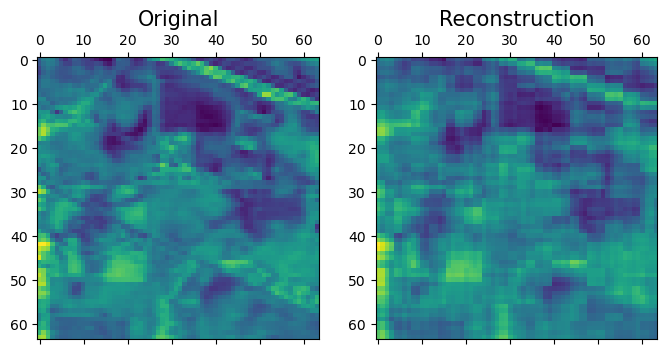

MSE:  0.001979333212643419
Pearson correlation coefficient:  0.9336113715622925


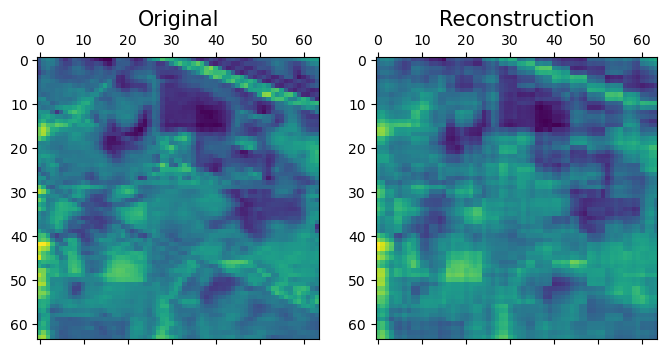

MSE:  0.001832388614430333
Pearson correlation coefficient:  0.9328042711421473


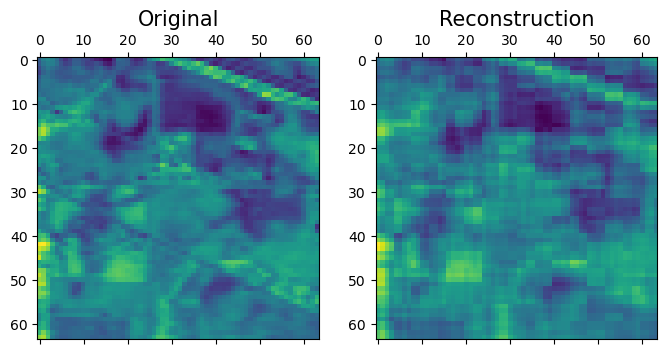

MSE:  0.0018054909258829364
Pearson correlation coefficient:  0.9323645312300122


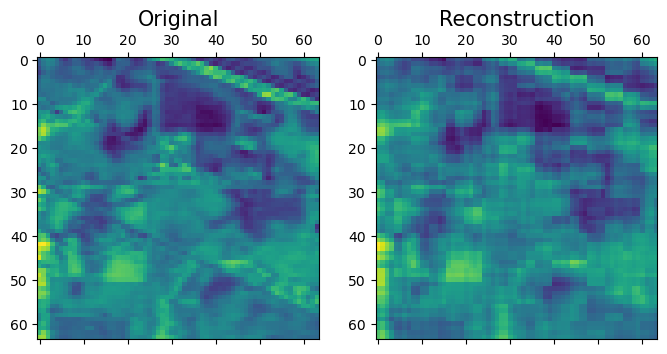

MSE:  0.0017891441999468875
Pearson correlation coefficient:  0.9327823190373654


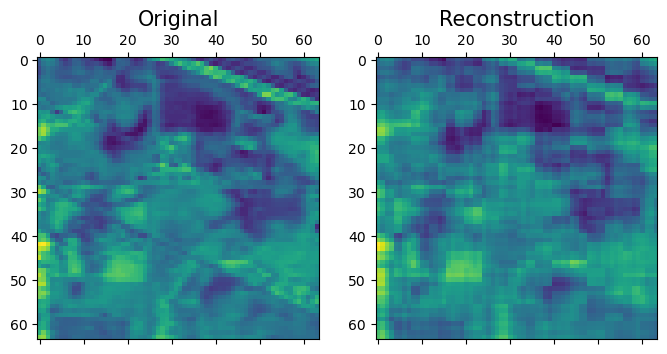

MSE:  0.0017382169203504815
Pearson correlation coefficient:  0.9327619194787363


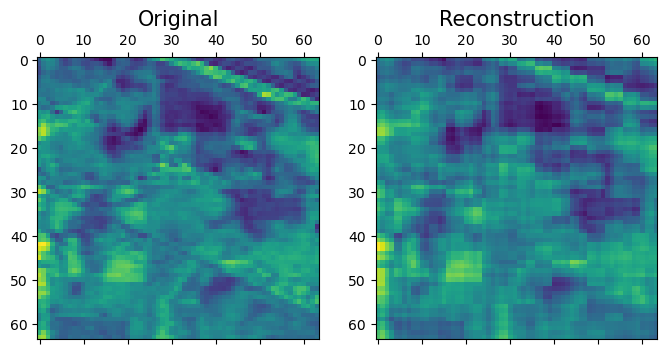

MSE:  0.0016297490532871247
Pearson correlation coefficient:  0.9273421029758184


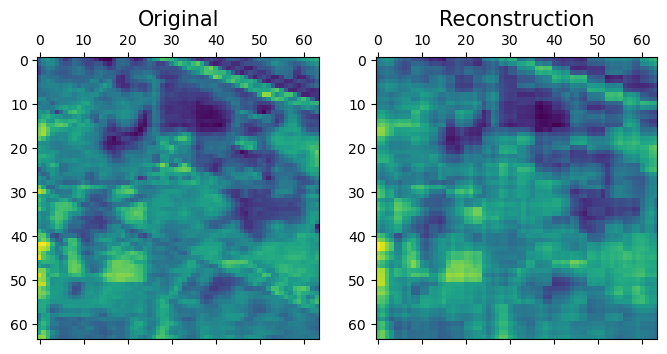

MSE:  0.0016356377386795209
Pearson correlation coefficient:  0.928702101966008


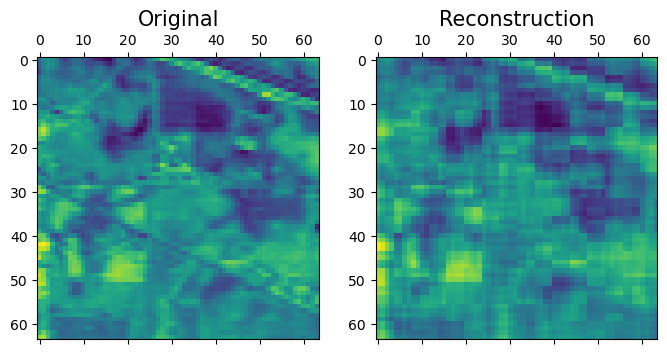

MSE:  0.0016472567505126782
Pearson correlation coefficient:  0.9280826951617199


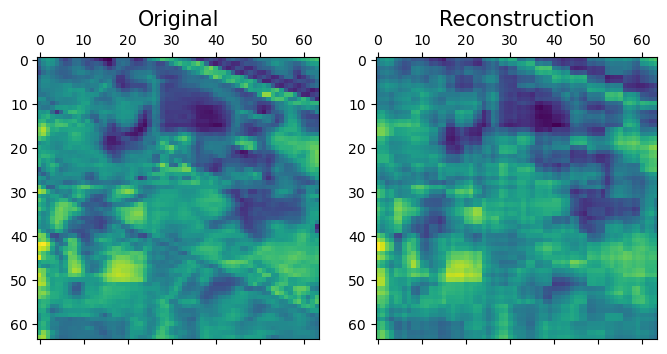

MSE:  0.0016978597875426102
Pearson correlation coefficient:  0.9307069702398676


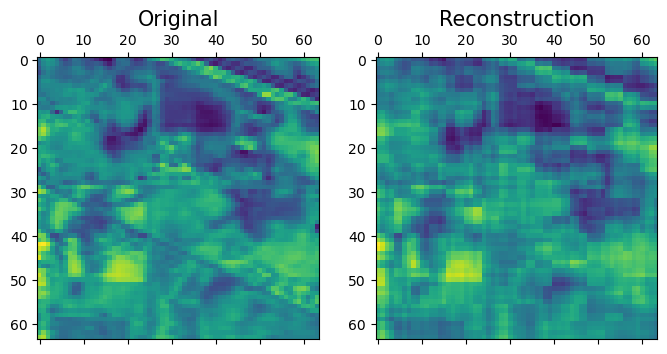

MSE:  0.0017479914443168849
Pearson correlation coefficient:  0.9312816862471411


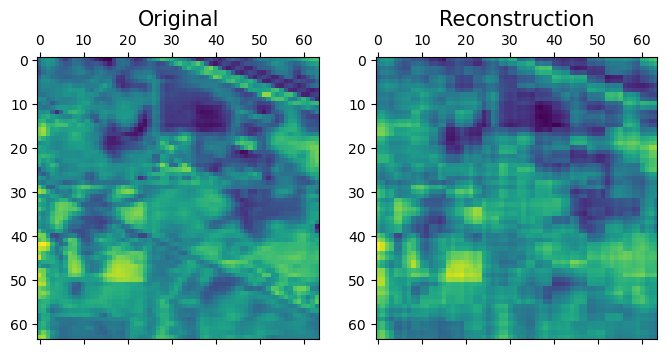

MSE:  0.001797242203762123
Pearson correlation coefficient:  0.9311394370210933


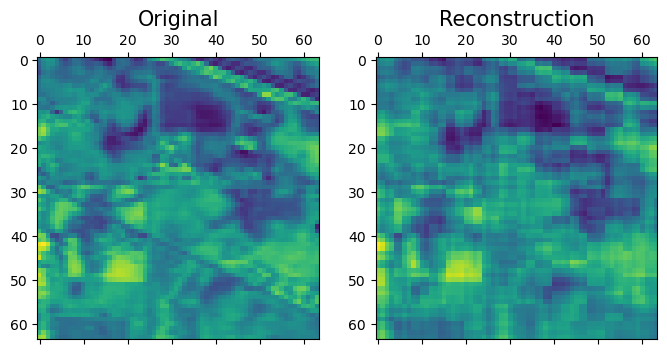

MSE:  0.0018294064477848153
Pearson correlation coefficient:  0.931305374431774


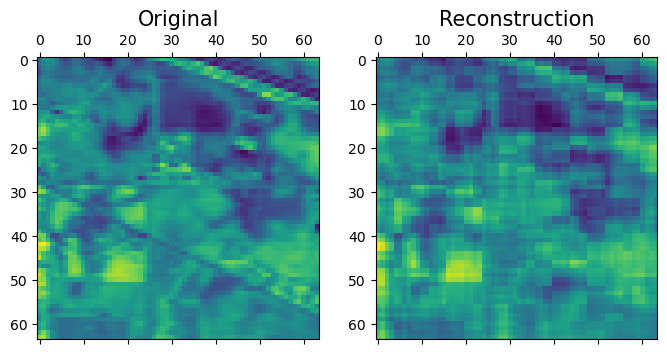

MSE:  0.0018187411953343884
Pearson correlation coefficient:  0.9311195982261968


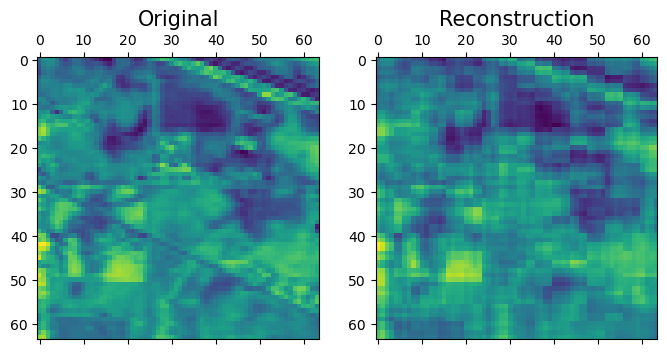

MSE:  0.0018218169901613097
Pearson correlation coefficient:  0.9306261798001784


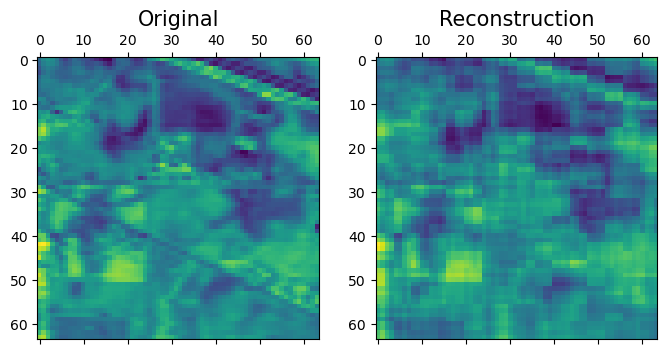

MSE:  0.0018163127405310836
Pearson correlation coefficient:  0.930398619731224


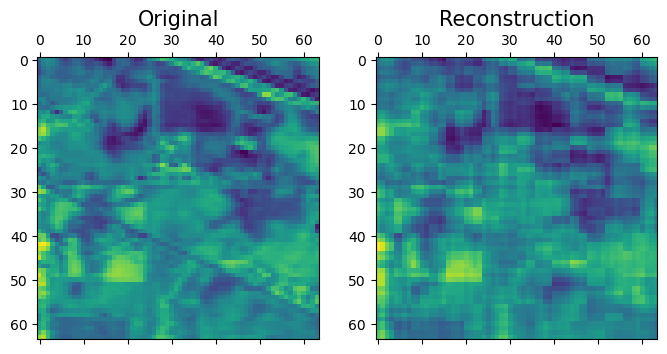

MSE:  0.0018159494874825906
Pearson correlation coefficient:  0.9303061463357223


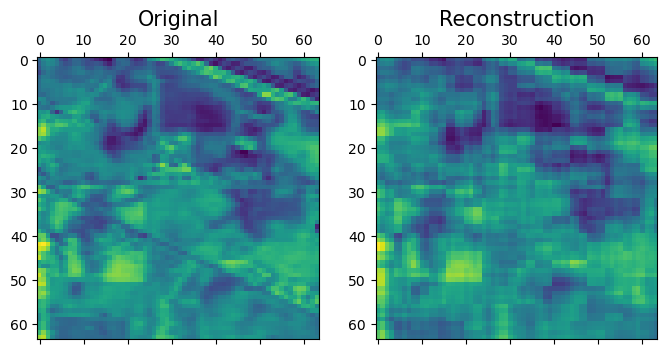

MSE:  0.0018118327032927008
Pearson correlation coefficient:  0.9303788172967793


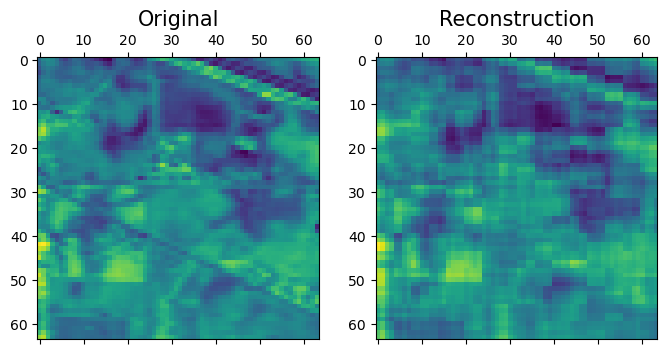

MSE:  0.0018113402757627339
Pearson correlation coefficient:  0.9288675926613984


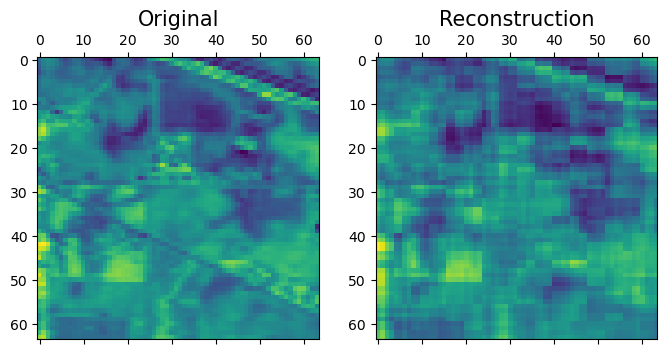

MSE:  0.001795188153897052
Pearson correlation coefficient:  0.9288702420303903


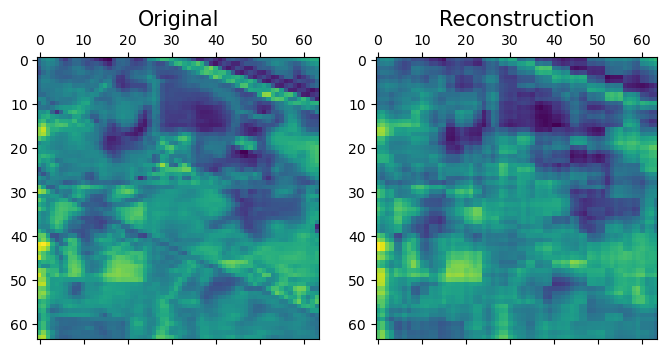

MSE:  0.0017859617702123288
Pearson correlation coefficient:  0.9286708871363174


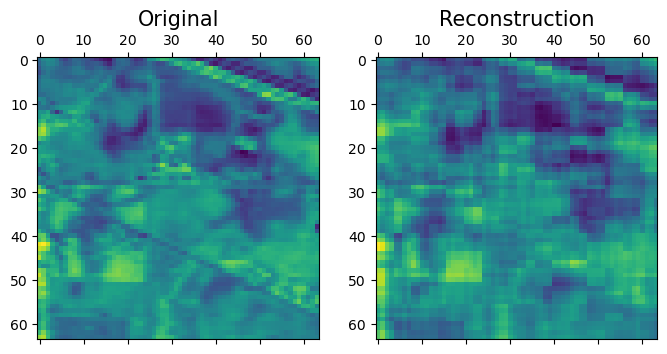

MSE:  0.001778692127711702
Pearson correlation coefficient:  0.9273120730141013


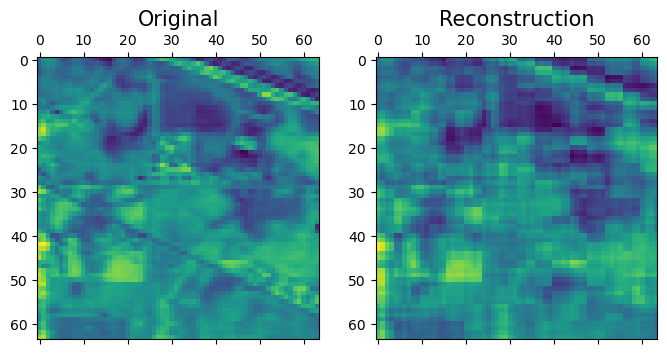

MSE:  0.0017575954240115666
Pearson correlation coefficient:  0.9274017615283053


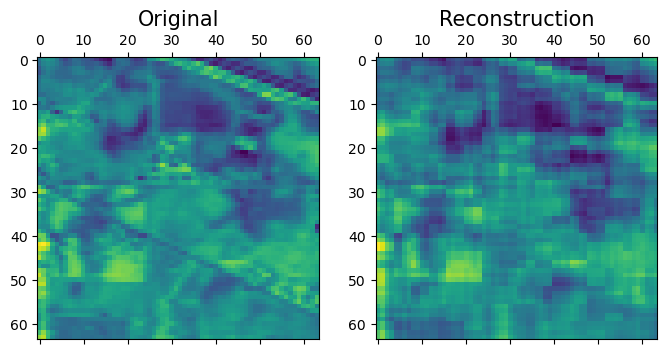

MSE:  0.0017143292611436667
Pearson correlation coefficient:  0.9256556452259164


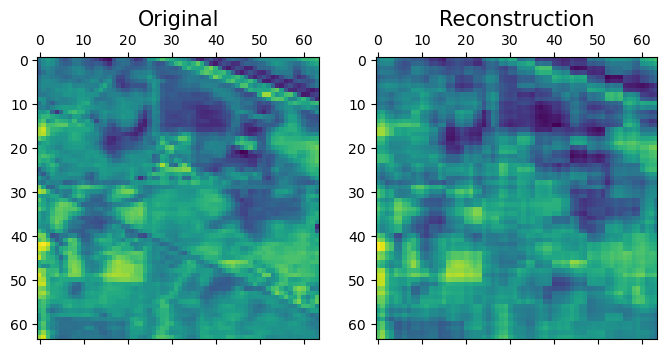

MSE:  0.0016635422824854119
Pearson correlation coefficient:  0.9254635245673604


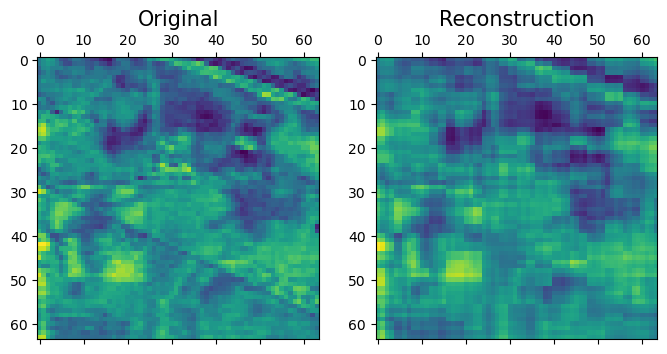

MSE:  0.0016108415967401681
Pearson correlation coefficient:  0.9136614505284977


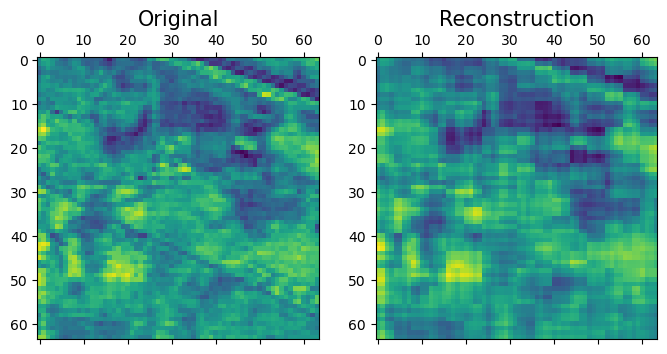

MSE:  0.0016075353913616796
Pearson correlation coefficient:  0.905016627140016


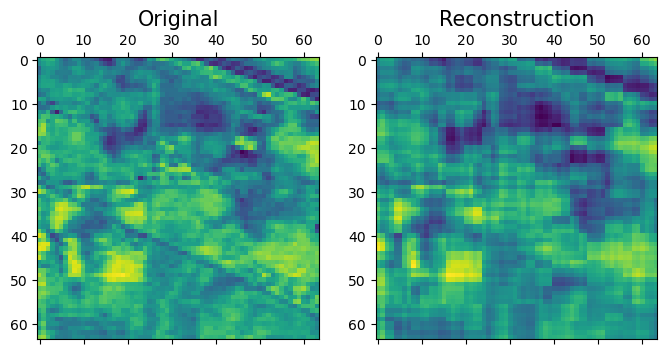

MSE:  0.0016148121288771609
Pearson correlation coefficient:  0.9114862093654245


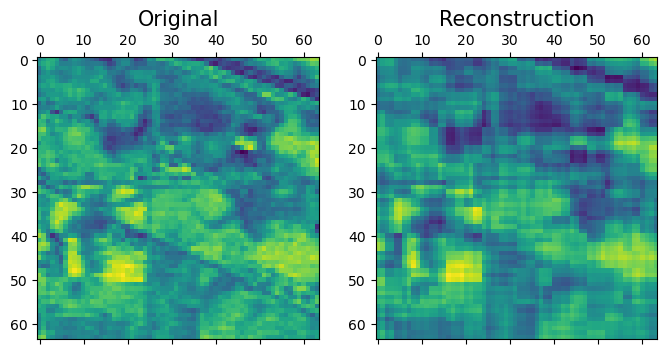

MSE:  0.0016122778395882766
Pearson correlation coefficient:  0.9106823864701092


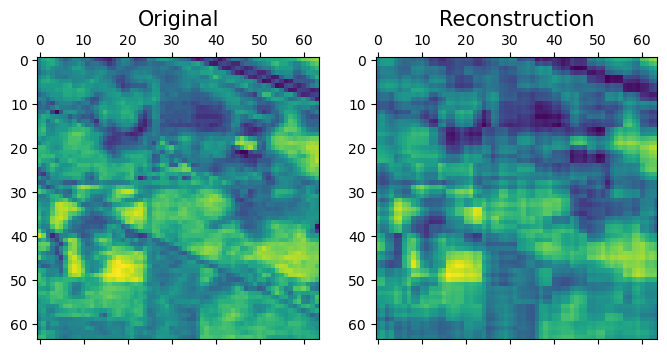

MSE:  0.0016305314102979032
Pearson correlation coefficient:  0.9248781161543244


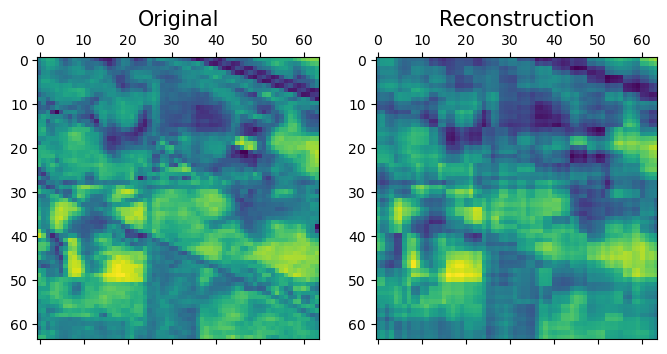

MSE:  0.0016629925185385214
Pearson correlation coefficient:  0.9280195398480187


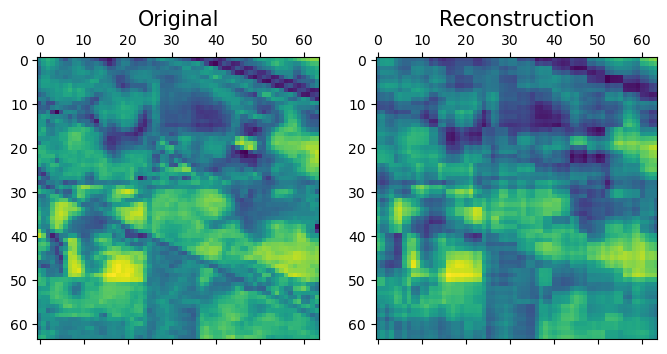

MSE:  0.0016724705912967803
Pearson correlation coefficient:  0.9276189082621393


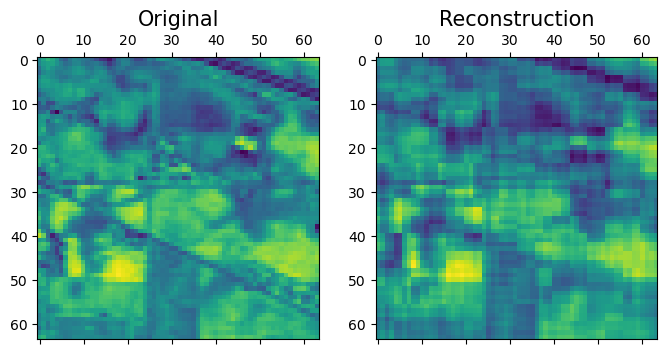

MSE:  0.0016727138388866977
Pearson correlation coefficient:  0.9282172486137512


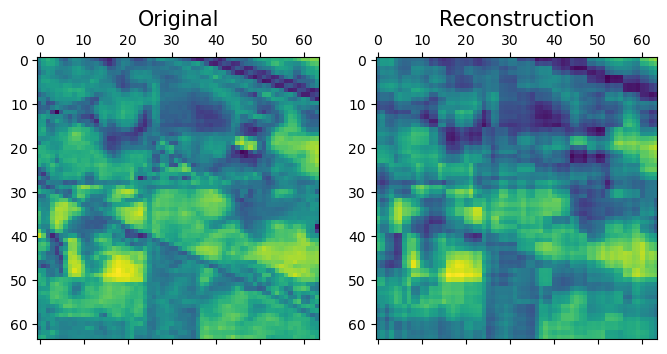

MSE:  0.0016789239079487979
Pearson correlation coefficient:  0.9279807230086903


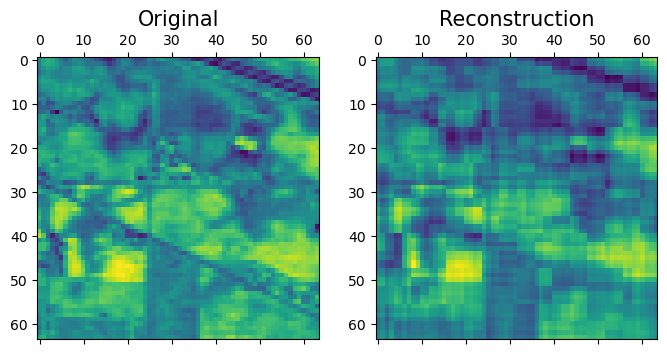

MSE:  0.0016805053543264745
Pearson correlation coefficient:  0.9256928043088988


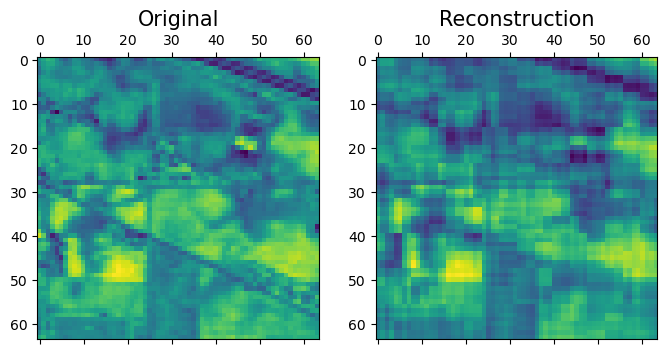

MSE:  0.001685465062980976
Pearson correlation coefficient:  0.9254839362896838


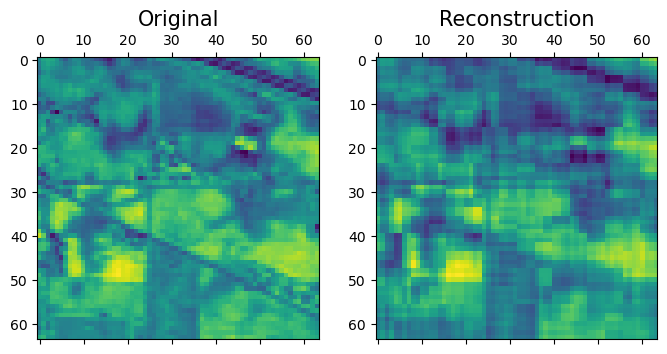

MSE:  0.0016921348132301814
Pearson correlation coefficient:  0.9252431508898611


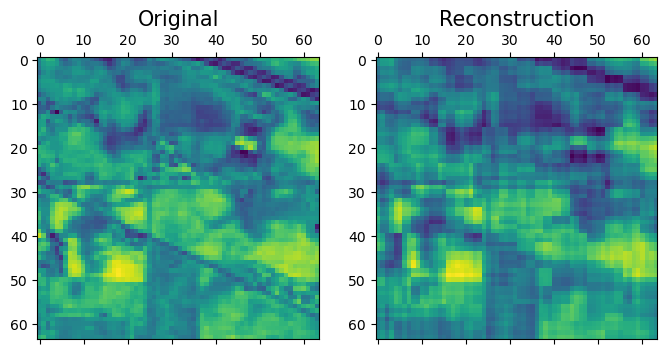

MSE:  0.0016990746224797516
Pearson correlation coefficient:  0.9237740176104257


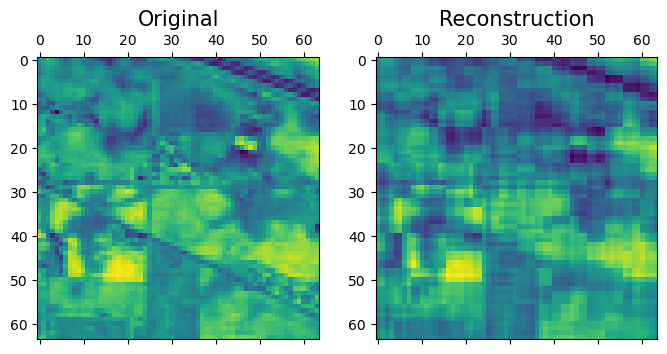

MSE:  0.0016980236474013516
Pearson correlation coefficient:  0.9229080323272754


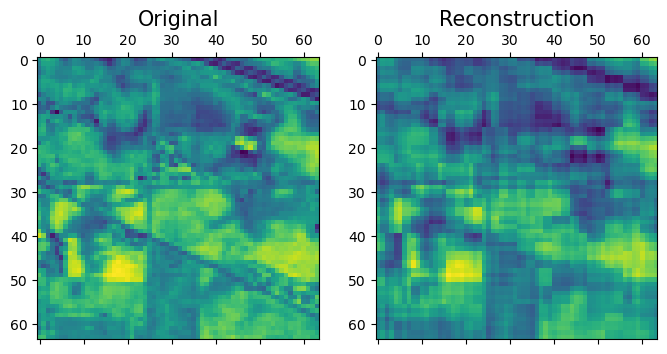

MSE:  0.0016896311067329441
Pearson correlation coefficient:  0.9219315781683309


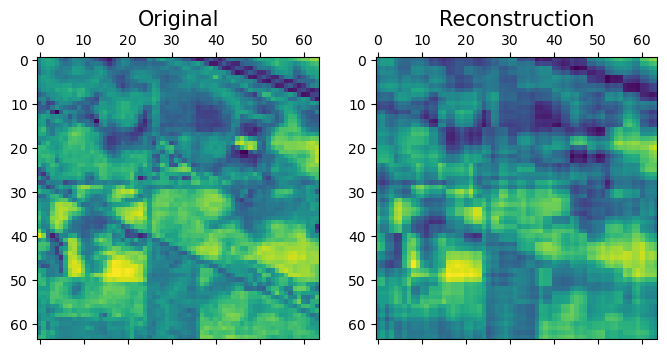

MSE:  0.001666004290187997
Pearson correlation coefficient:  0.9211940052219467


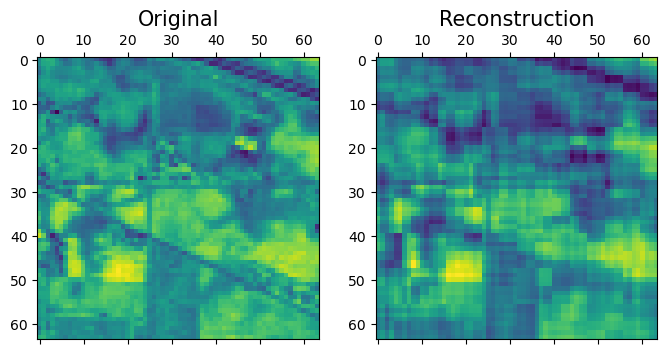

MSE:  0.0016712937453513322
Pearson correlation coefficient:  0.9219905436324647


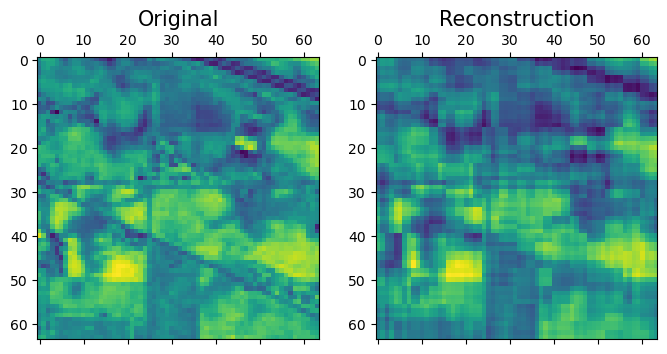

MSE:  0.0016838815557213972
Pearson correlation coefficient:  0.9237068798977206


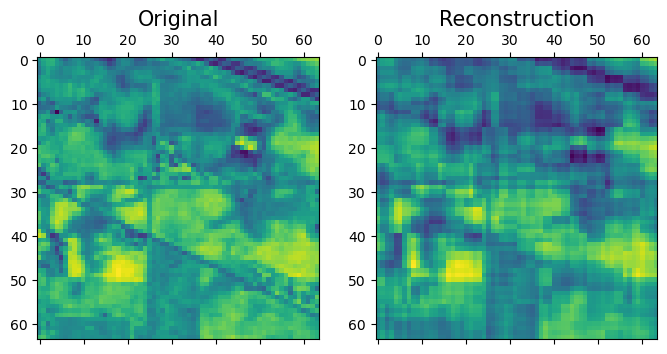

MSE:  0.0016677474207269513
Pearson correlation coefficient:  0.9173092133413421


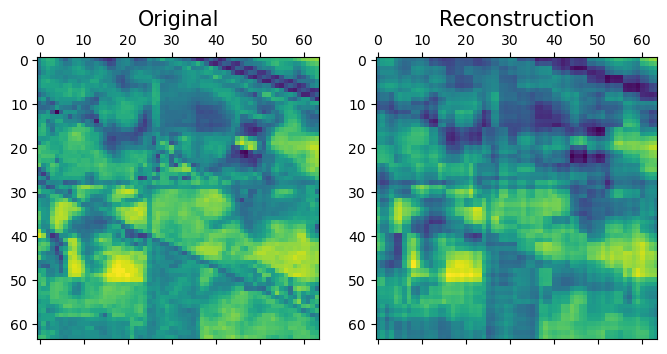

MSE:  0.0016785760729817415
Pearson correlation coefficient:  0.9197248871929414


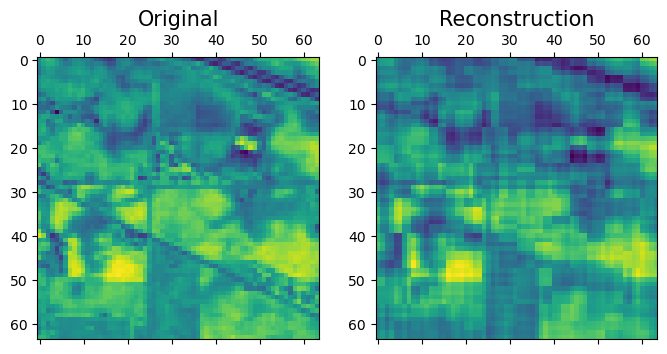

MSE:  0.001677619382706377
Pearson correlation coefficient:  0.9222154760099124


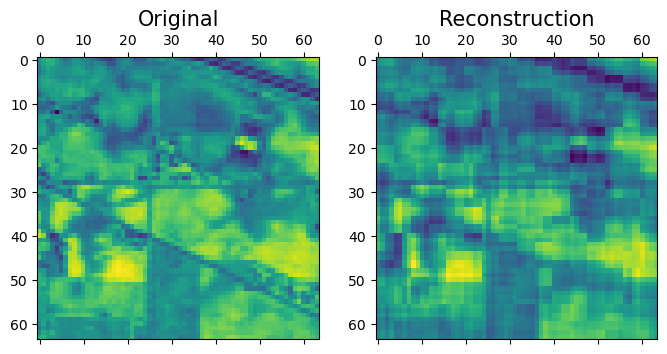

MSE:  0.0016630303743593536
Pearson correlation coefficient:  0.9246526851720682


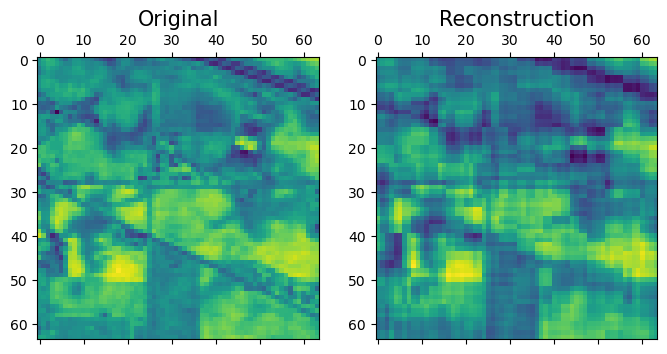

MSE:  0.0016457597522764912
Pearson correlation coefficient:  0.9269642399303673


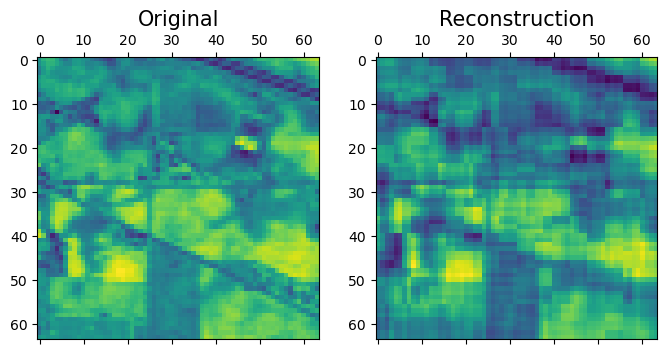

MSE:  0.001634063614080542
Pearson correlation coefficient:  0.9316215984574339


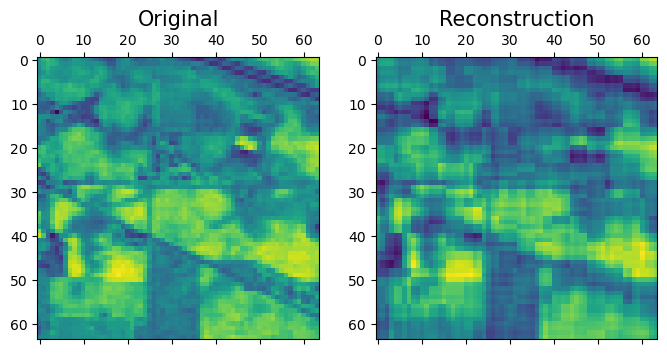

MSE:  0.0016157784581570822
Pearson correlation coefficient:  0.936877500082


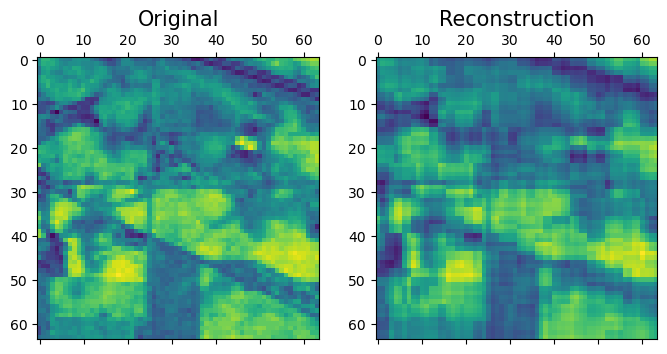

MSE:  0.0016072574725592083
Pearson correlation coefficient:  0.9399169111657607


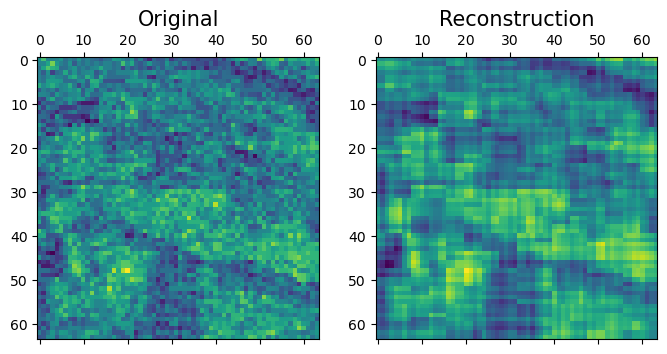

MSE:  0.001600843963078964
Pearson correlation coefficient:  0.8014759292401511


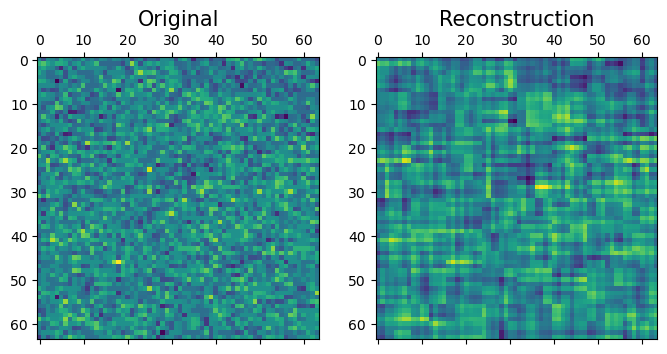

MSE:  0.0016007991809602476
Pearson correlation coefficient:  0.5822008205452183


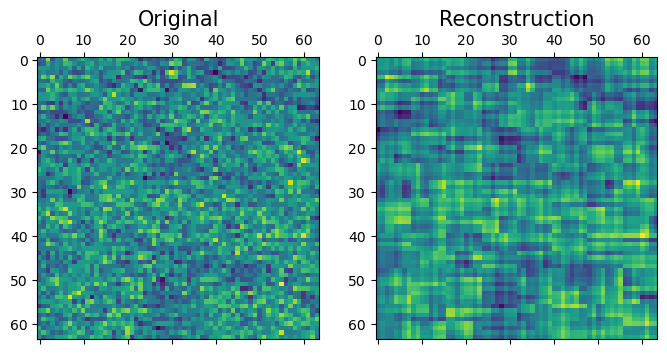

MSE:  0.001600578271418984
Pearson correlation coefficient:  0.6360429974205609


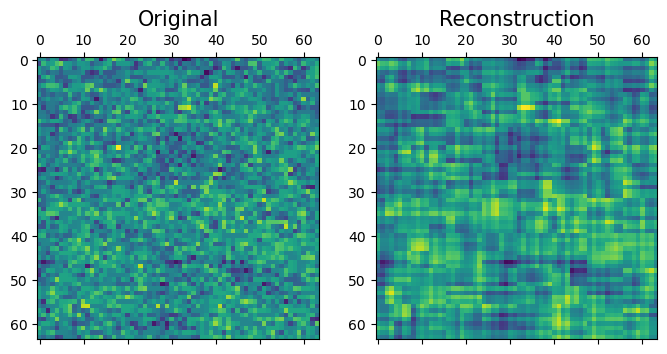

MSE:  0.001600608578358685
Pearson correlation coefficient:  0.6300152841878679


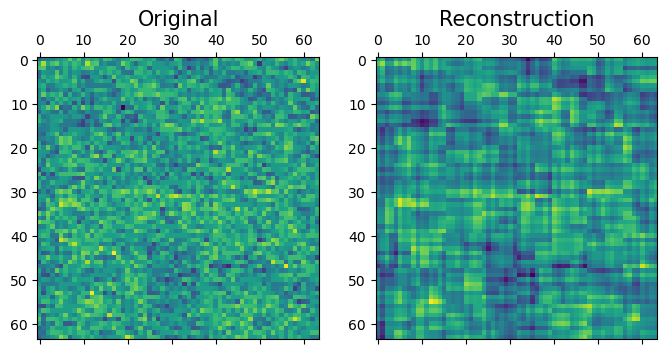

MSE:  0.001600459418035605
Pearson correlation coefficient:  0.6320942055855714


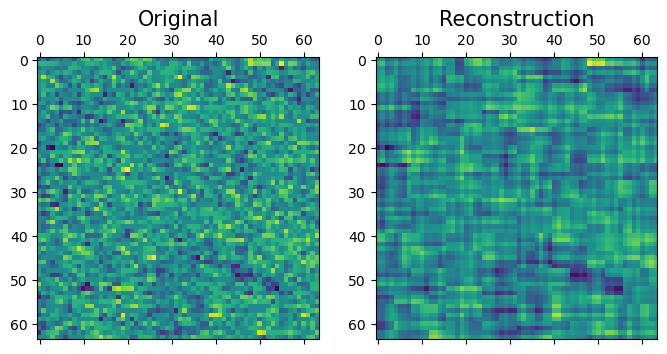

MSE:  0.001600397901832847
Pearson correlation coefficient:  0.6205878188636382


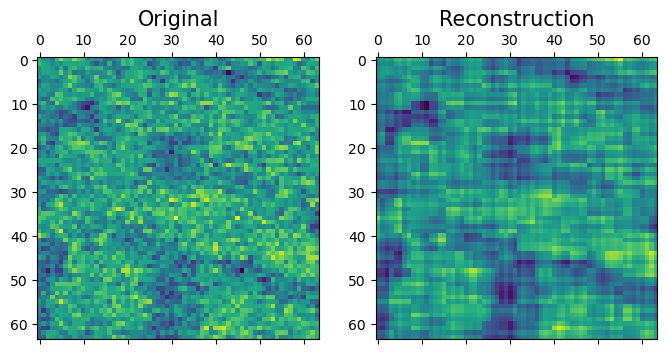

MSE:  0.0016004336894278118
Pearson correlation coefficient:  0.736293779331324


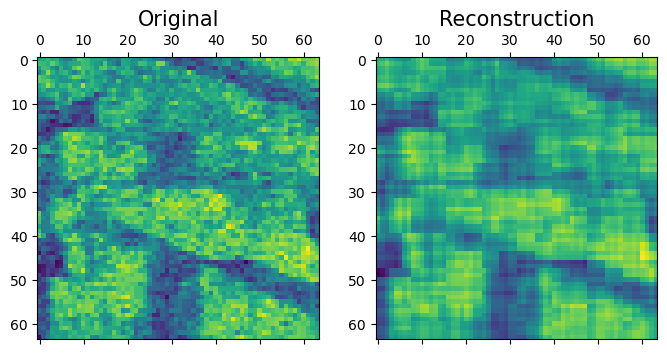

MSE:  0.001600542770985682
Pearson correlation coefficient:  0.8966851713193998


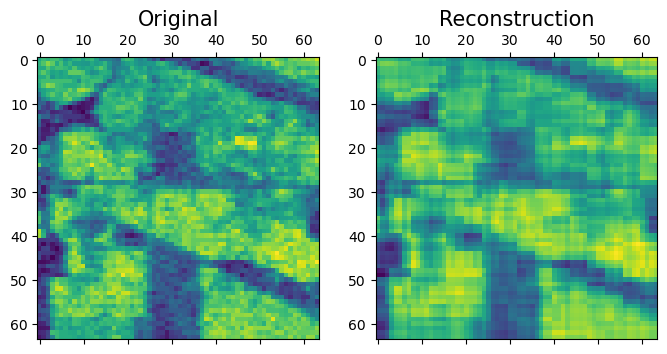

MSE:  0.0016007669363249967
Pearson correlation coefficient:  0.9413475091136134


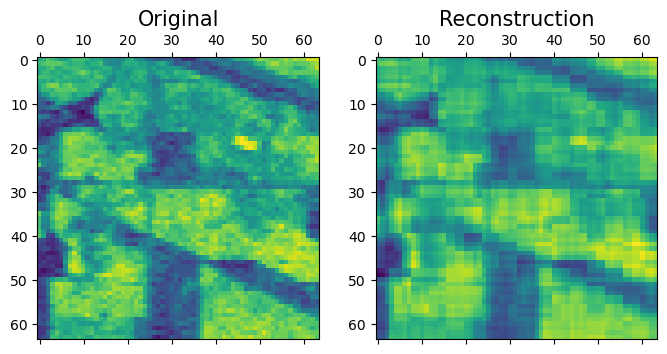

MSE:  0.0016010459598799318
Pearson correlation coefficient:  0.9469387874371962


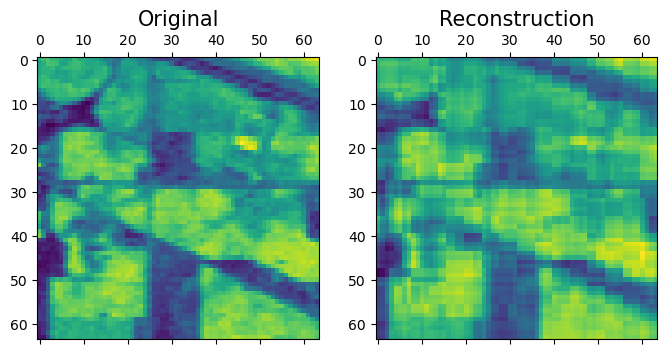

MSE:  0.0016037805616307653
Pearson correlation coefficient:  0.961731943170824


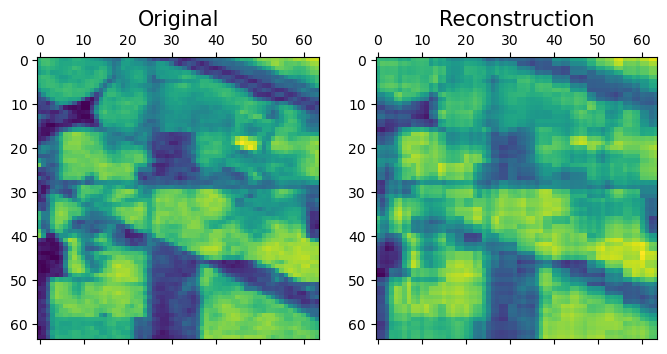

MSE:  0.001607223154011905
Pearson correlation coefficient:  0.962755553111596


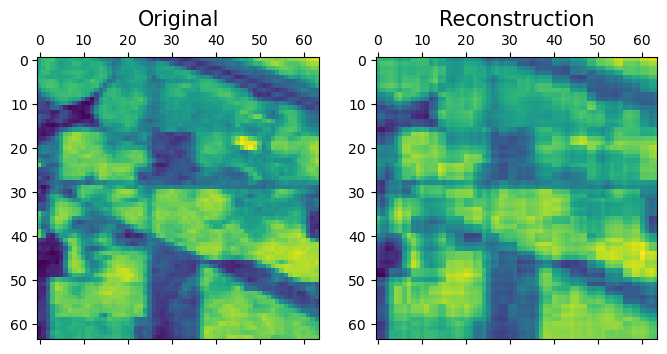

MSE:  0.001603882012700863
Pearson correlation coefficient:  0.9619166766404861


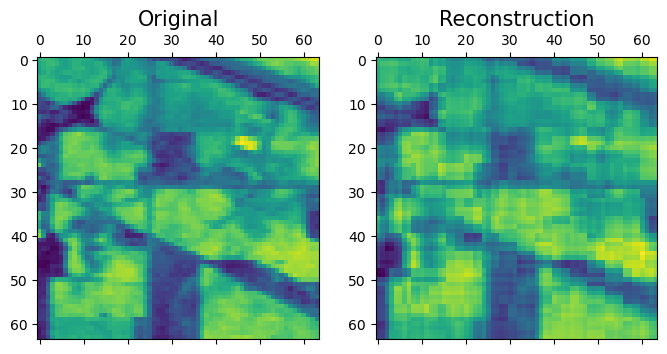

MSE:  0.001607589529880299
Pearson correlation coefficient:  0.9626624380673386


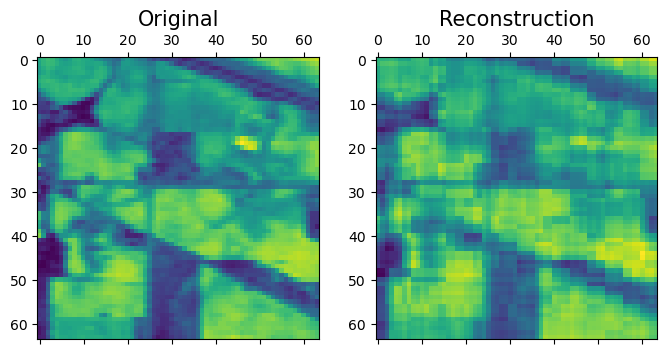

MSE:  0.0016209830361731408
Pearson correlation coefficient:  0.9637277778036226


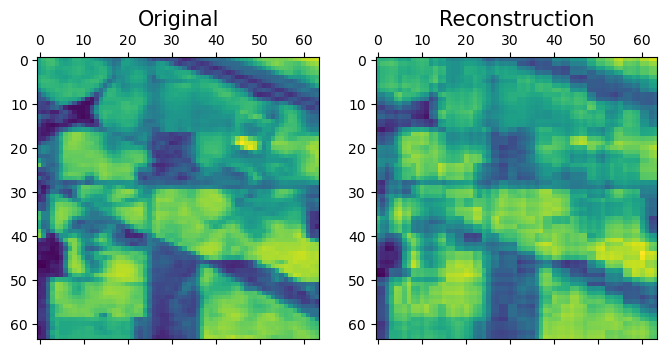

MSE:  0.0016377427393933636
Pearson correlation coefficient:  0.9644268257394448


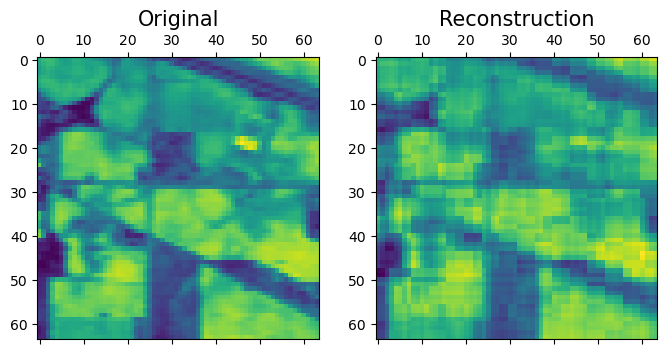

MSE:  0.0016511038555656662
Pearson correlation coefficient:  0.9641935123570164


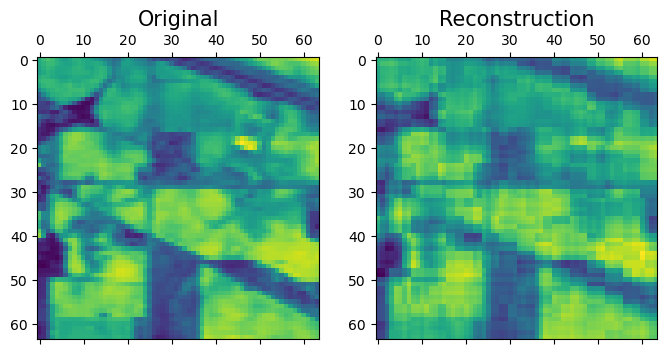

MSE:  0.0016598492981263722
Pearson correlation coefficient:  0.964302124919306


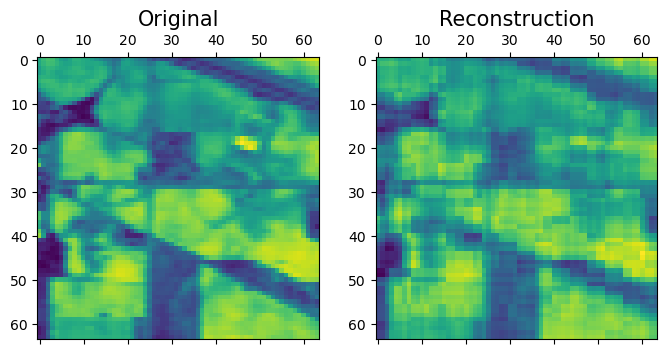

MSE:  0.0016632794879581267
Pearson correlation coefficient:  0.9642336393408196


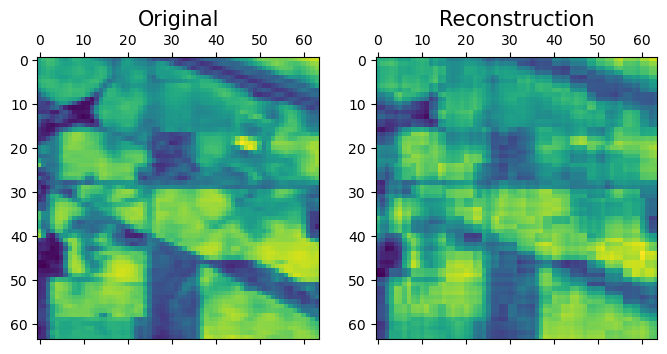

MSE:  0.0016644846051089056
Pearson correlation coefficient:  0.9638190050574522


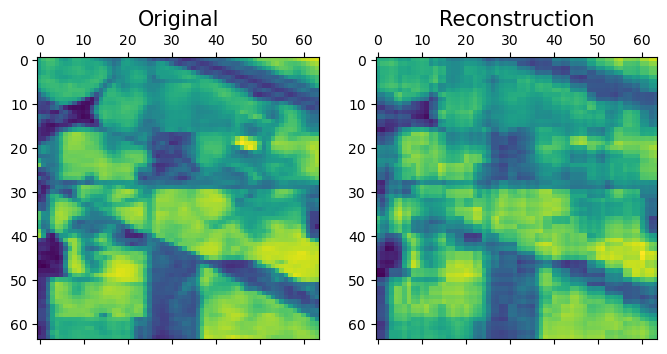

MSE:  0.0016623104526993044
Pearson correlation coefficient:  0.9638282373097364


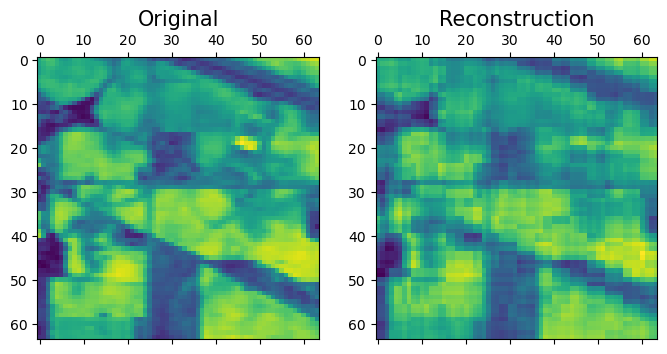

MSE:  0.0016587121913617601
Pearson correlation coefficient:  0.9634968862934566


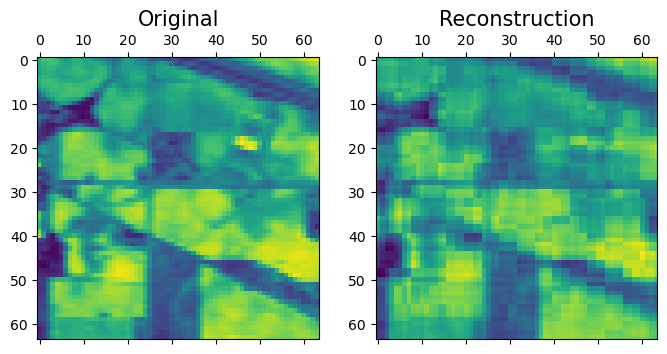

MSE:  0.0016471789801944634
Pearson correlation coefficient:  0.9631225044570395


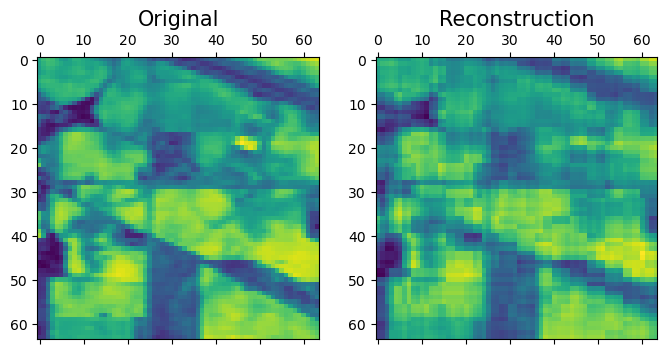

MSE:  0.0016461894343960722
Pearson correlation coefficient:  0.9630347233160541


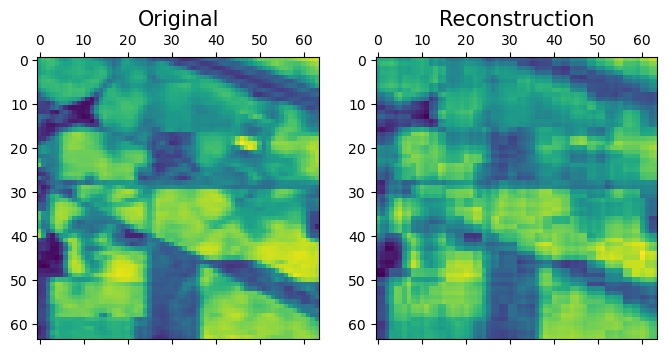

MSE:  0.0016475516841577263
Pearson correlation coefficient:  0.9630327880322791


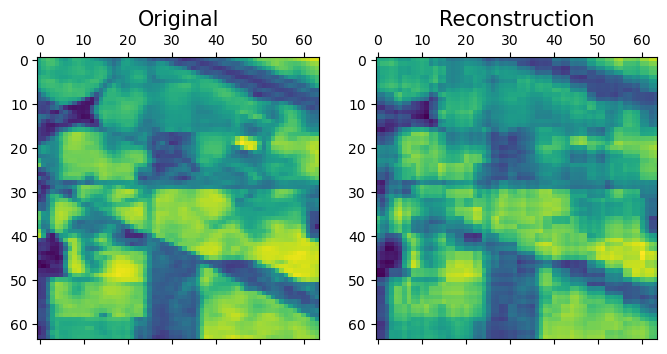

MSE:  0.001642803839857797
Pearson correlation coefficient:  0.9626918449456827


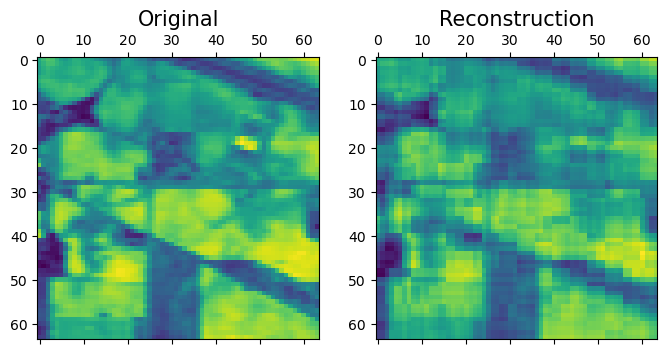

MSE:  0.0016414805571551953
Pearson correlation coefficient:  0.9619605313894295


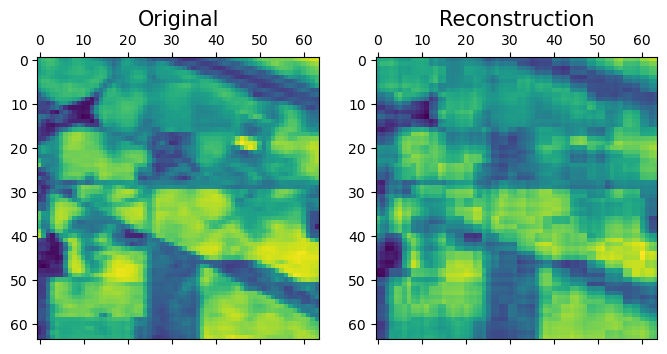

MSE:  0.001644041948261561
Pearson correlation coefficient:  0.961924934912807


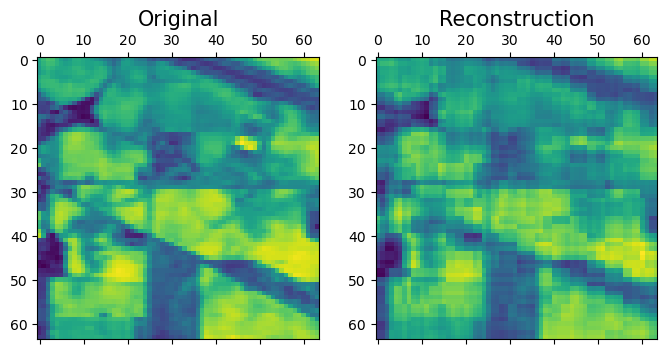

MSE:  0.0016431329784121229
Pearson correlation coefficient:  0.9617835913807427


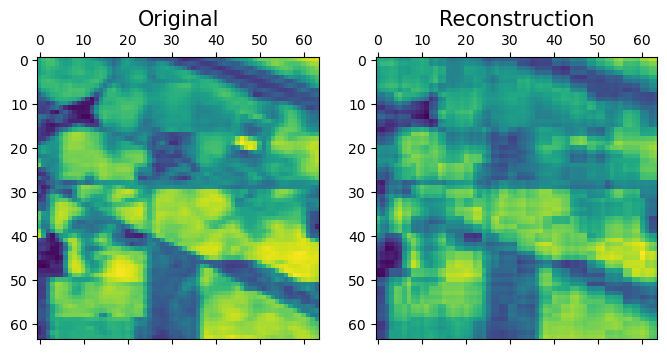

MSE:  0.0016386348750103295
Pearson correlation coefficient:  0.9612510566320767


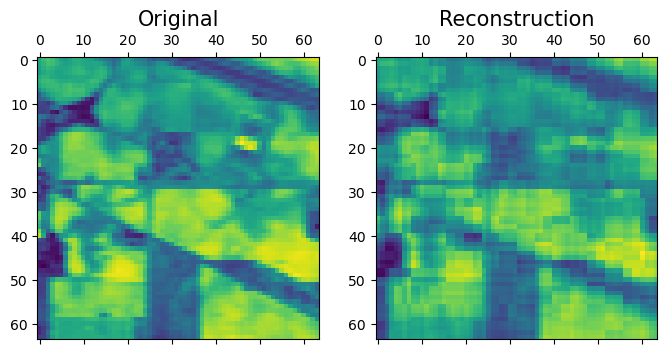

MSE:  0.001636737687661516
Pearson correlation coefficient:  0.9612473331978117


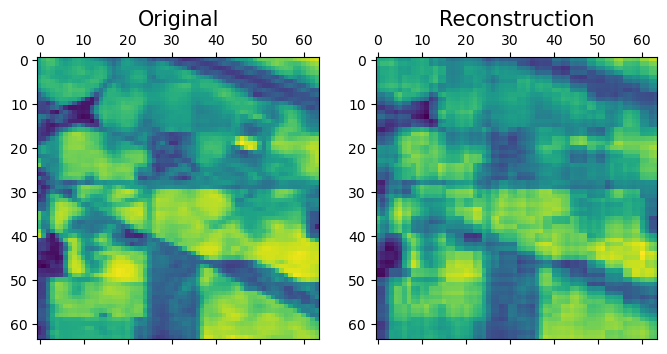

MSE:  0.0016363666877553895
Pearson correlation coefficient:  0.9610176044468273


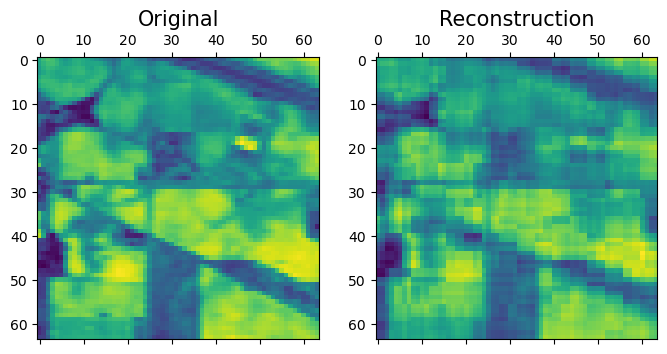

MSE:  0.0016340284398897171
Pearson correlation coefficient:  0.9609734019651545


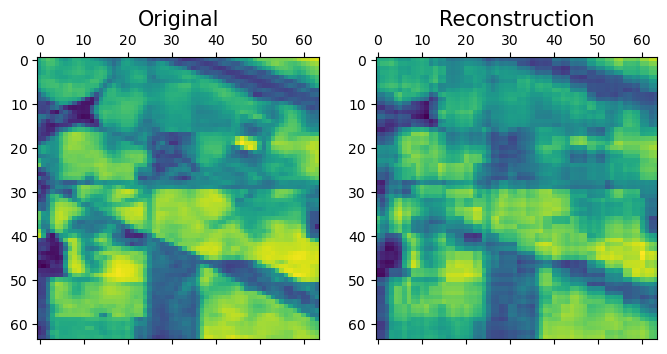

MSE:  0.0016330164651865414
Pearson correlation coefficient:  0.9611006530142404


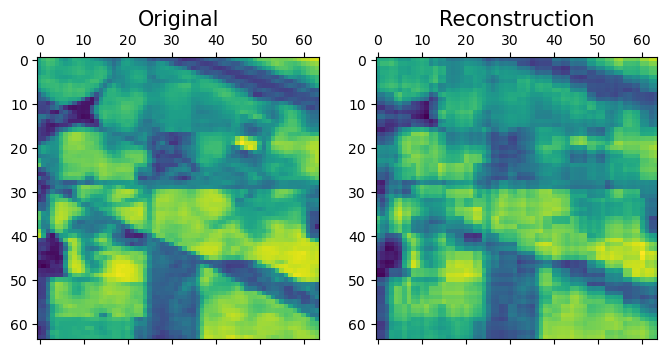

MSE:  0.0016316260751446654
Pearson correlation coefficient:  0.9608747544104121


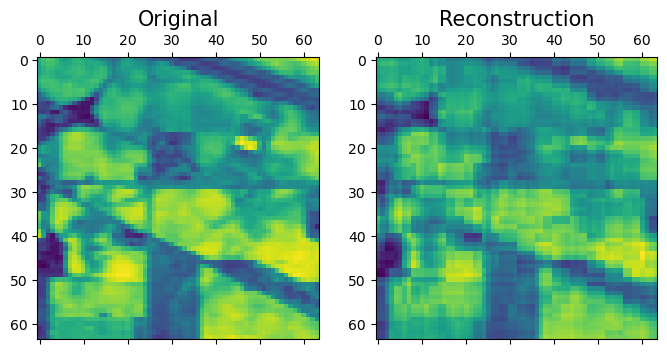

MSE:  0.0016297078728416342
Pearson correlation coefficient:  0.9610467949307023


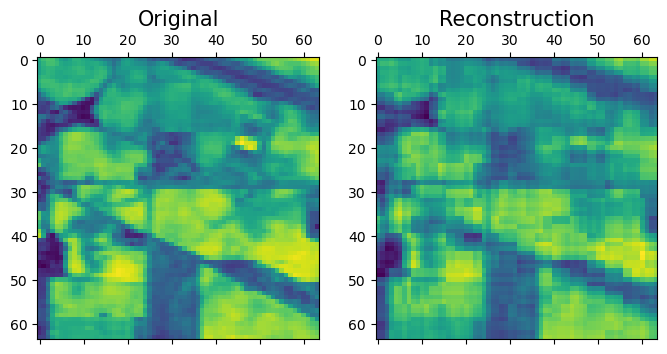

MSE:  0.0016277642448002264
Pearson correlation coefficient:  0.9610853866166462


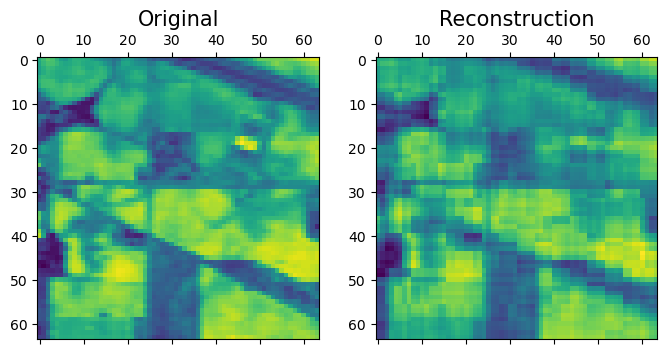

MSE:  0.0016260099636893574
Pearson correlation coefficient:  0.961333397875493


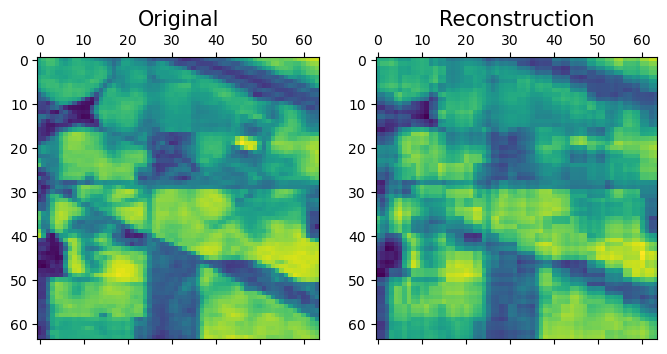

MSE:  0.0016230903251503812
Pearson correlation coefficient:  0.9609462024205111


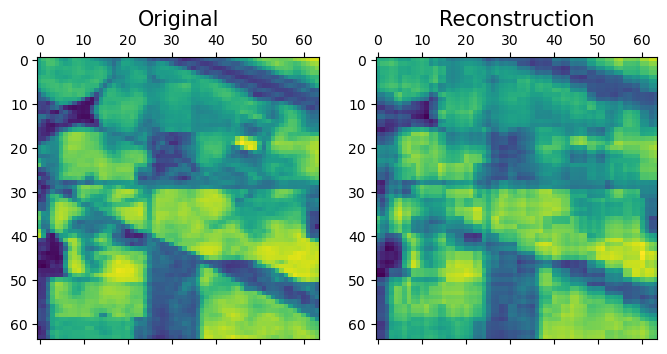

MSE:  0.00162054338767989
Pearson correlation coefficient:  0.9609470966559965


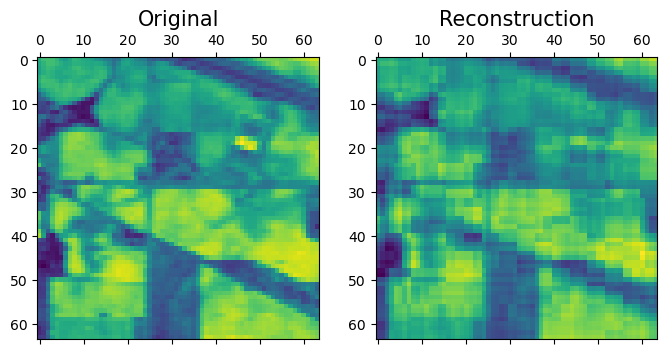

MSE:  0.0016195353376806648
Pearson correlation coefficient:  0.9610879082395498


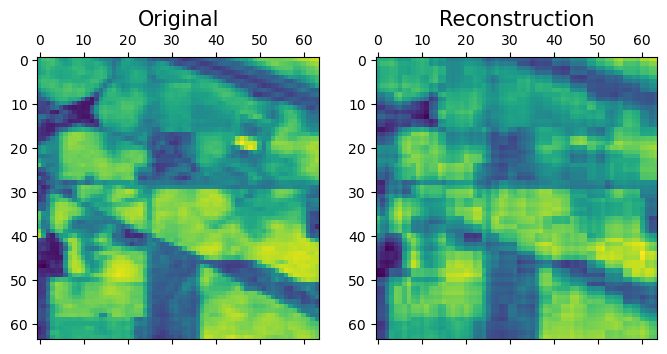

MSE:  0.0016175112382264985
Pearson correlation coefficient:  0.9607864548788283


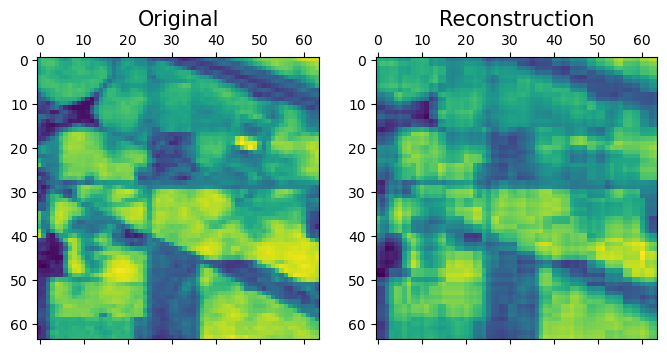

MSE:  0.0016123733173414256
Pearson correlation coefficient:  0.9612212622720977


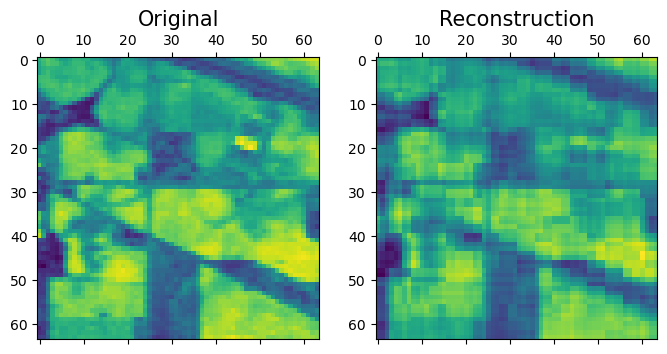

MSE:  0.0016073080812357159
Pearson correlation coefficient:  0.9601825723905332


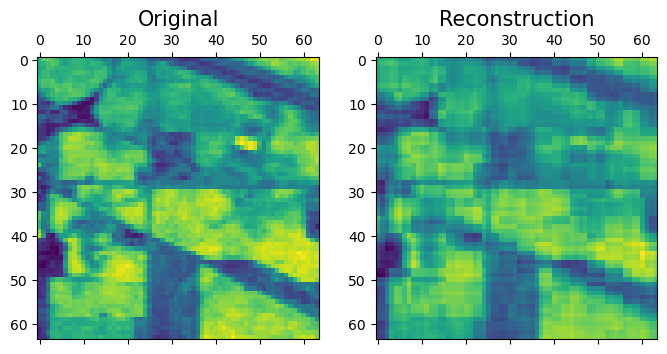

MSE:  0.0016038523117783386
Pearson correlation coefficient:  0.957752242374158


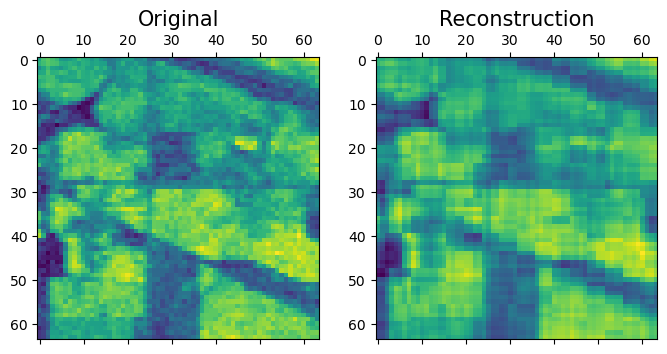

MSE:  0.0016010412084173542
Pearson correlation coefficient:  0.9473767646777029


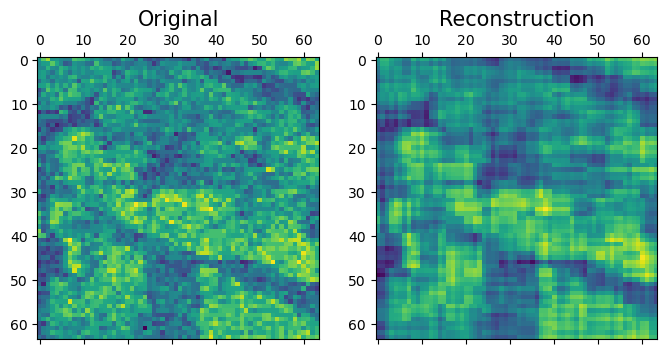

MSE:  0.0016003973112080822
Pearson correlation coefficient:  0.8346007358855658


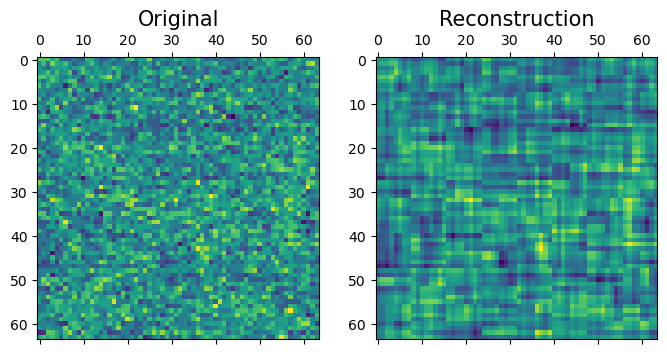

MSE:  0.0016005256151342788
Pearson correlation coefficient:  0.5995193359534661


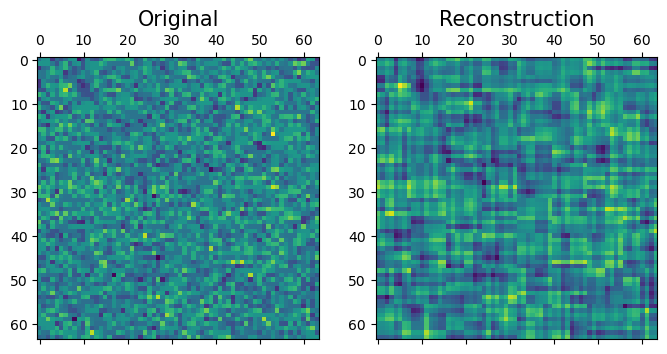

MSE:  0.001600397437659811
Pearson correlation coefficient:  0.5545434755569467


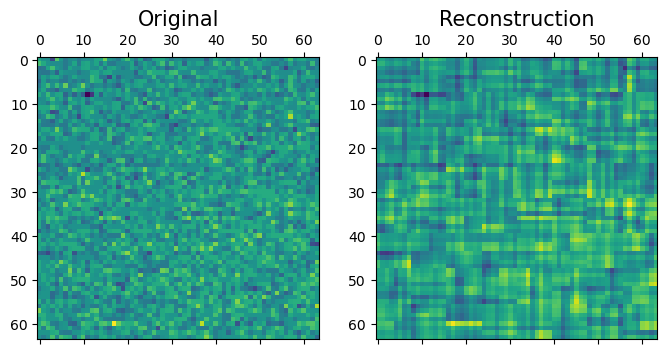

MSE:  0.0016006071759019041
Pearson correlation coefficient:  0.5691343629889231


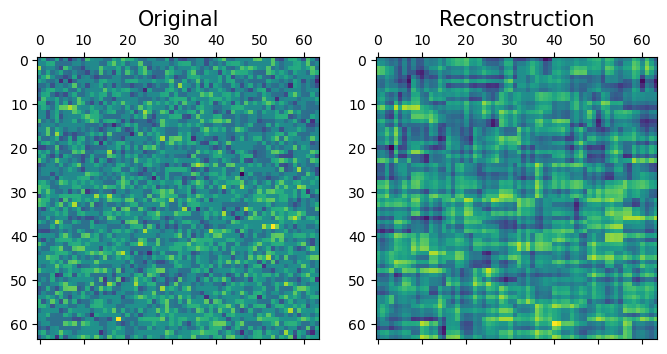

MSE:  0.0016006797465067941
Pearson correlation coefficient:  0.565596600840067


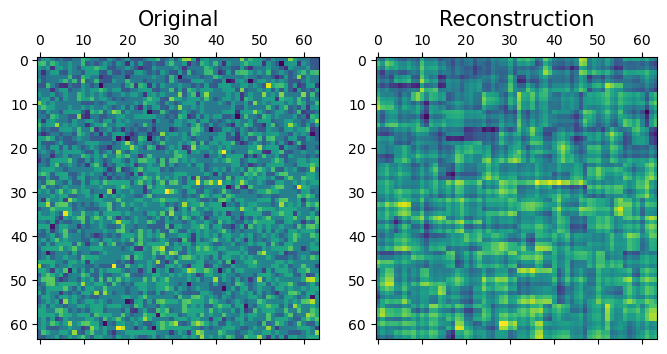

MSE:  0.0016007816341844273
Pearson correlation coefficient:  0.5549463603998543


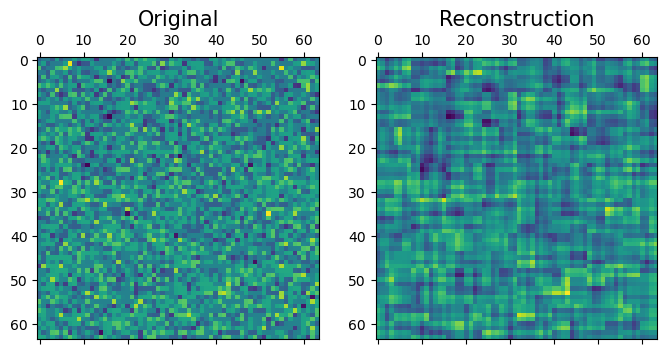

MSE:  0.0016011752427033438
Pearson correlation coefficient:  0.5418484933945819


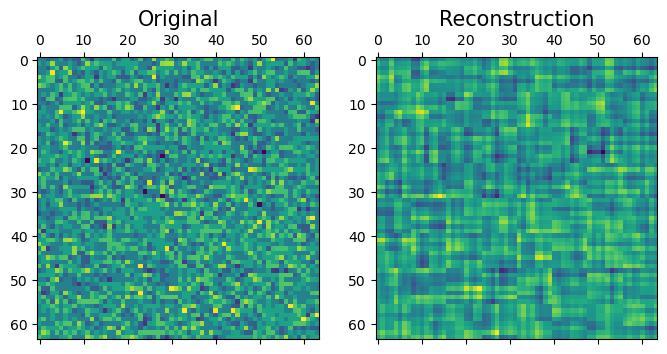

MSE:  0.001601114238421544
Pearson correlation coefficient:  0.5526873617031649


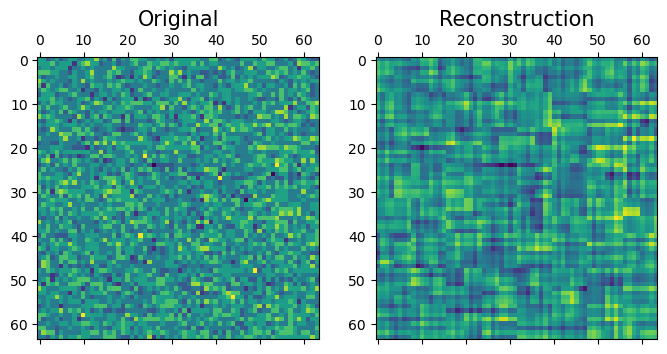

MSE:  0.0016010459920034203
Pearson correlation coefficient:  0.539143388585966


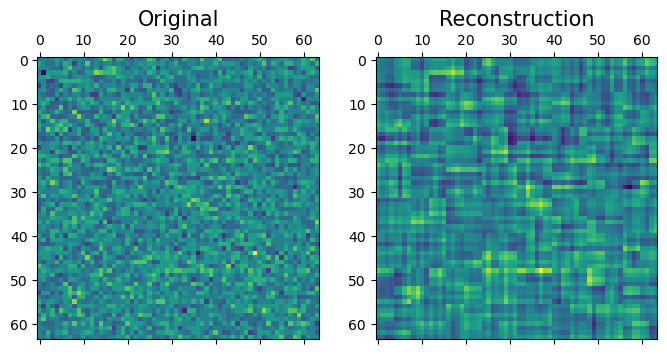

MSE:  0.0016003059617086908
Pearson correlation coefficient:  0.52479637517326


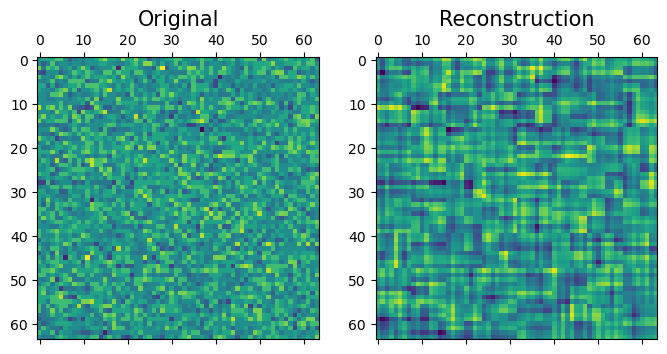

MSE:  0.001600284139033215
Pearson correlation coefficient:  0.5575731818499345


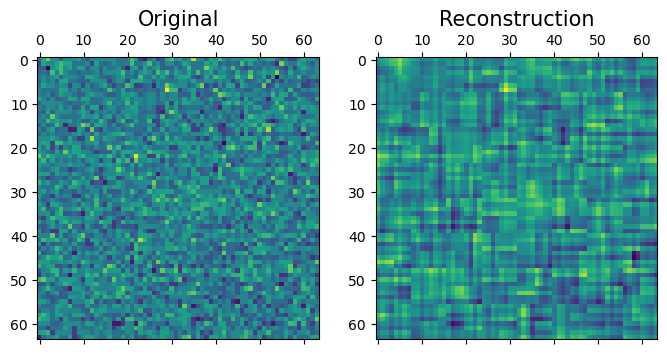

MSE:  0.0016003051020743154
Pearson correlation coefficient:  0.5441231142675028


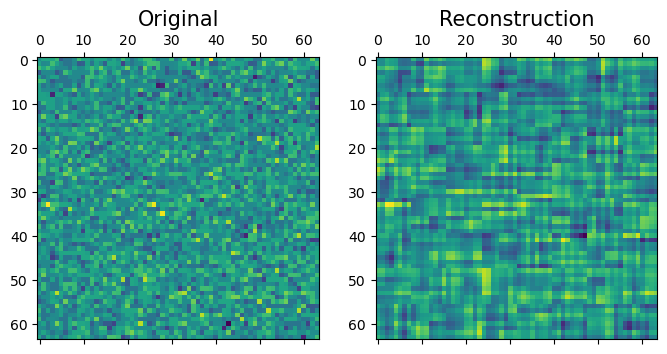

MSE:  0.0016003135103238035
Pearson correlation coefficient:  0.5430697548378274


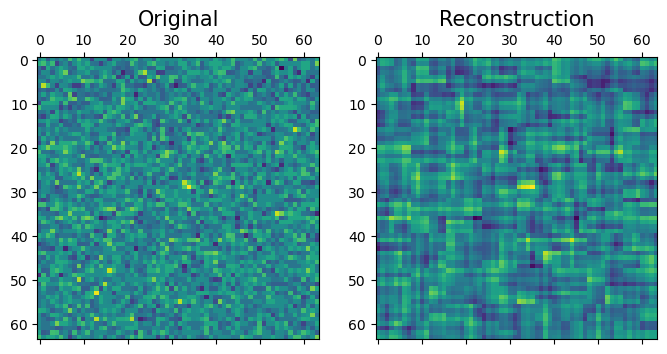

MSE:  0.0016002952670209883
Pearson correlation coefficient:  0.527796359554237


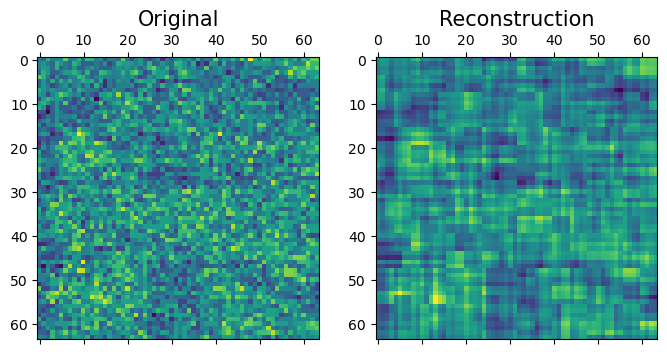

MSE:  0.0016002661532904688
Pearson correlation coefficient:  0.6335077660596491


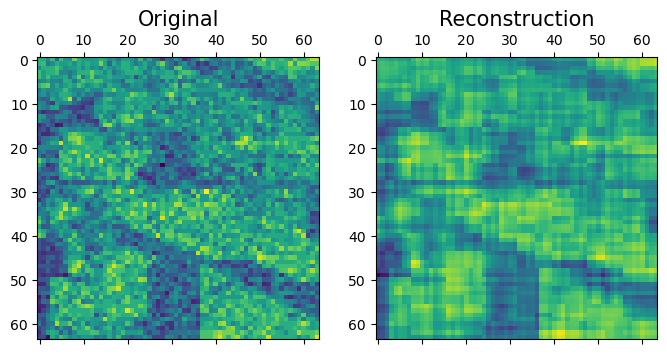

MSE:  0.001600373001164211
Pearson correlation coefficient:  0.8096634273366898


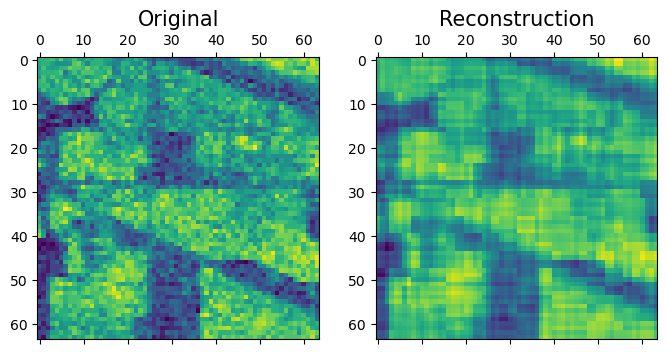

MSE:  0.0016004148951214868
Pearson correlation coefficient:  0.9015564769326817


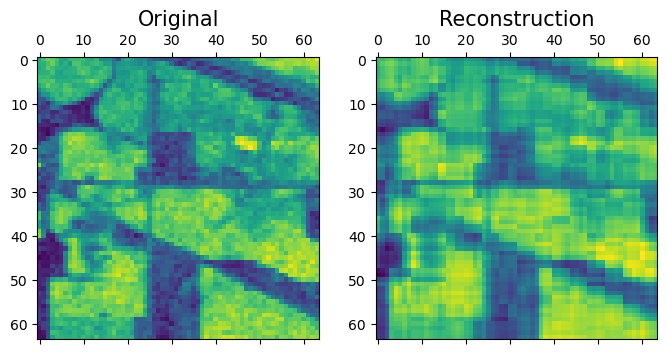

MSE:  0.0016012693182839454
Pearson correlation coefficient:  0.9514090392371803


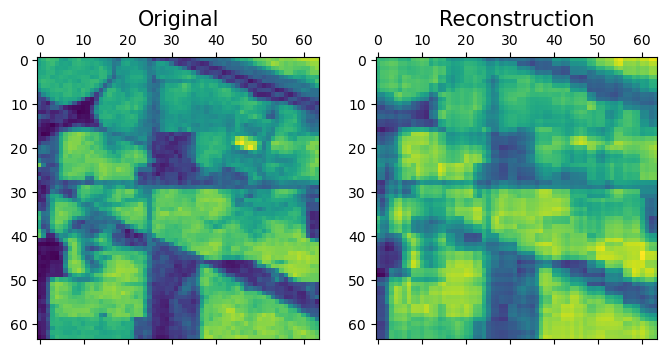

MSE:  0.0016045340597164114
Pearson correlation coefficient:  0.9601324975595813


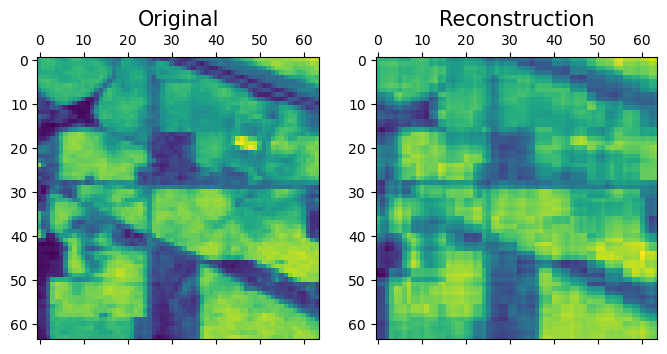

MSE:  0.001608067578638493
Pearson correlation coefficient:  0.9614495638201506


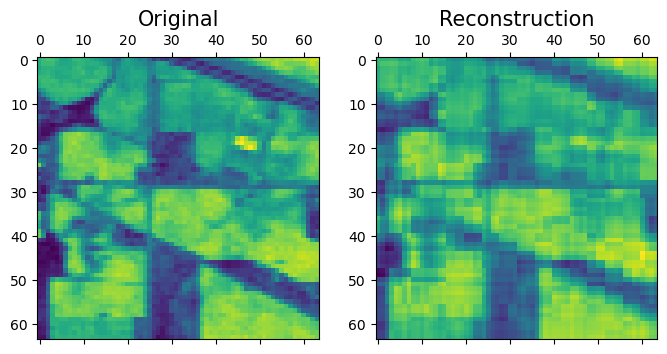

MSE:  0.0016053982568396967
Pearson correlation coefficient:  0.9613826114580903


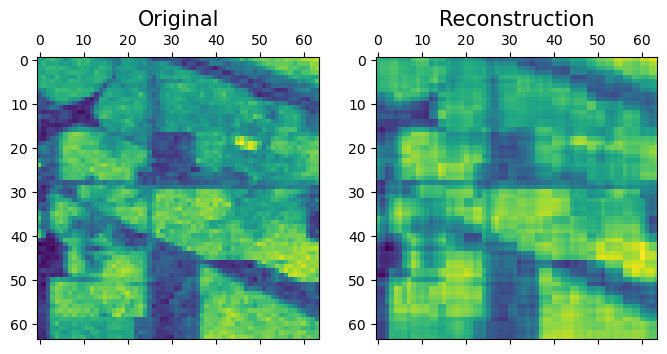

MSE:  0.0016010125340267059
Pearson correlation coefficient:  0.9521606179465355


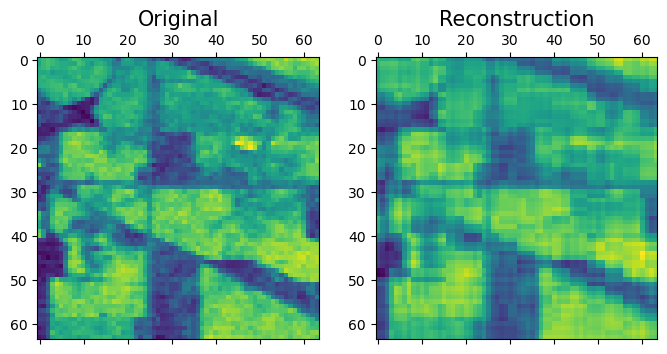

MSE:  0.0016010493761979762
Pearson correlation coefficient:  0.9547539096623802


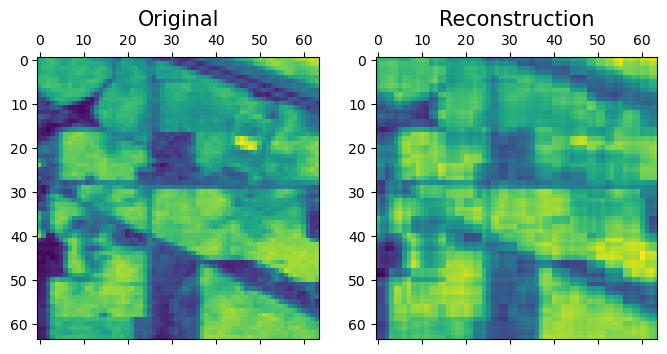

MSE:  0.0016040832261222631
Pearson correlation coefficient:  0.9610543181955338


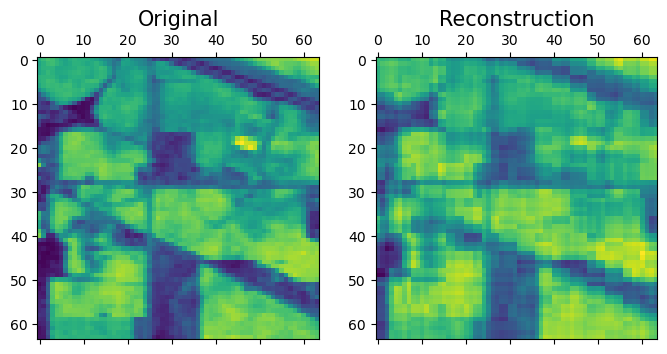

MSE:  0.001609369551578301
Pearson correlation coefficient:  0.9628971539911954


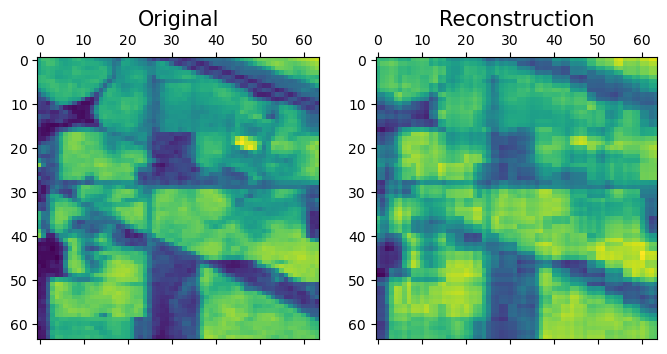

MSE:  0.0016086830158567873
Pearson correlation coefficient:  0.9622461079493856


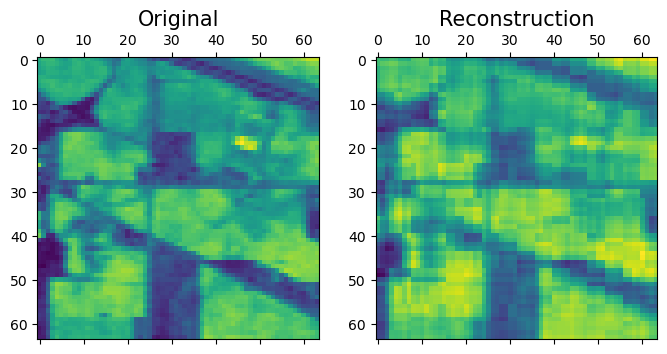

MSE:  0.0016051008785338819
Pearson correlation coefficient:  0.9618426154308058


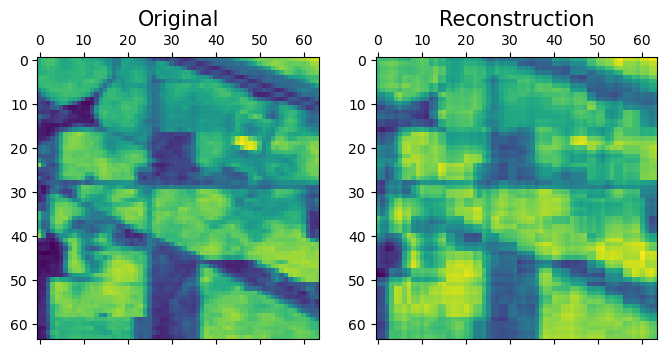

MSE:  0.0016050197814893427
Pearson correlation coefficient:  0.9619953437637239


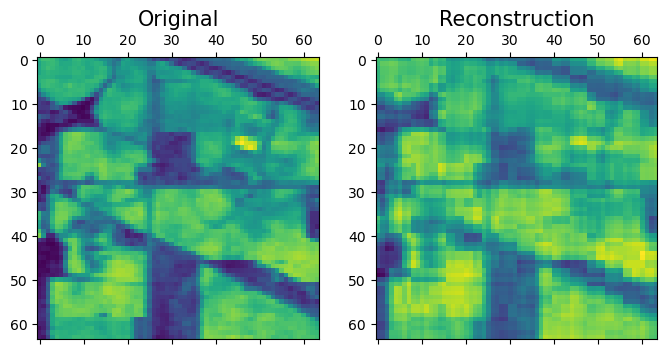

MSE:  0.0016069725074518387
Pearson correlation coefficient:  0.9621503231755062


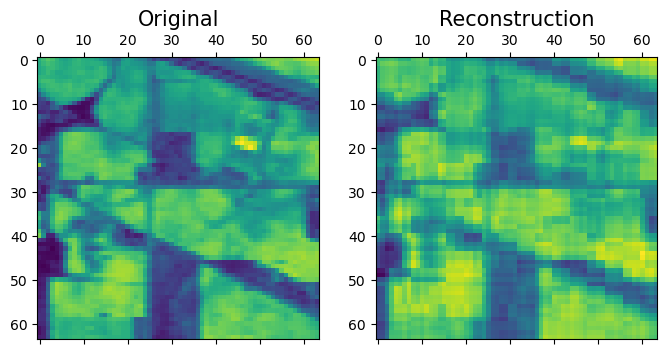

MSE:  0.0016099080176571866
Pearson correlation coefficient:  0.9626958887721062


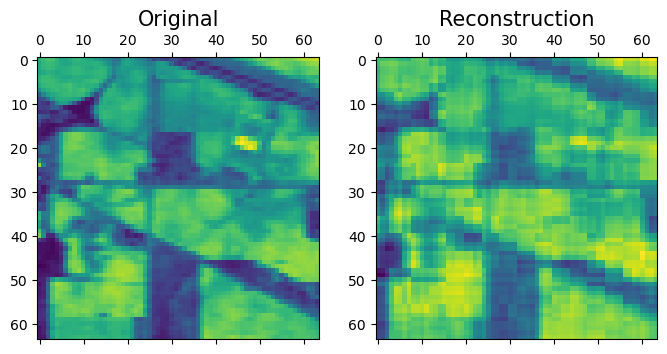

MSE:  0.0016108073452666813
Pearson correlation coefficient:  0.9627919050677027


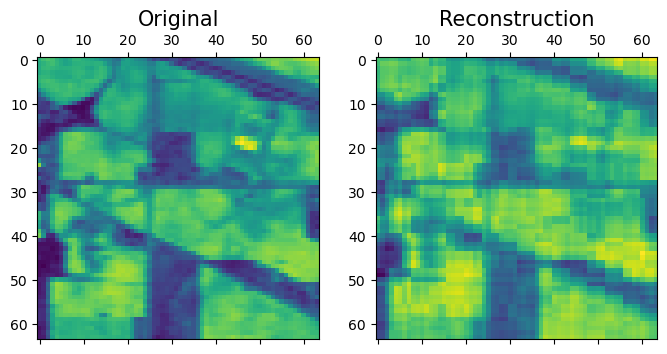

MSE:  0.0016109838611869304
Pearson correlation coefficient:  0.9626897953471144


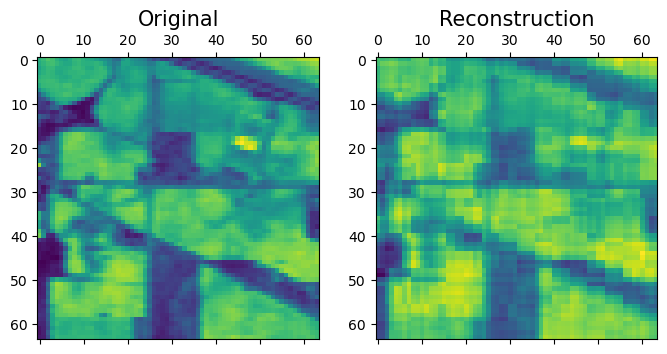

MSE:  0.0016104633178810972
Pearson correlation coefficient:  0.9629232908265066


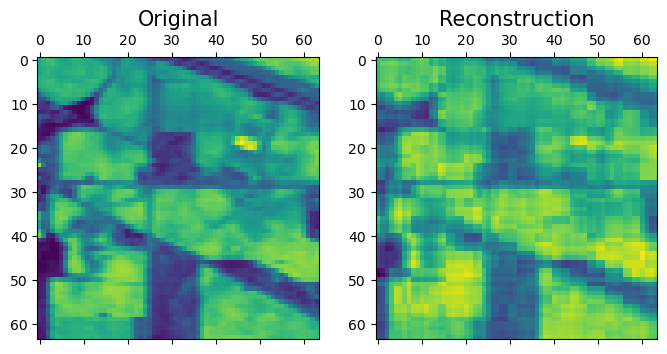

MSE:  0.0016101714161971862
Pearson correlation coefficient:  0.9631154293065564


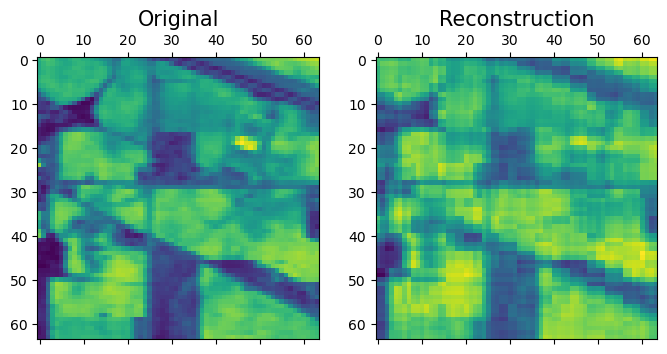

MSE:  0.0016100572552422798
Pearson correlation coefficient:  0.9633394175895459


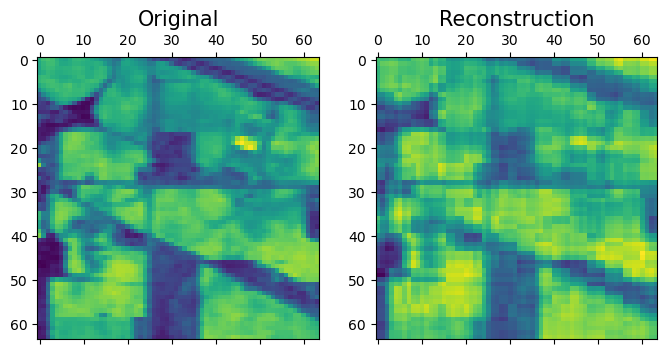

MSE:  0.0016095953190681743
Pearson correlation coefficient:  0.9627161570248387


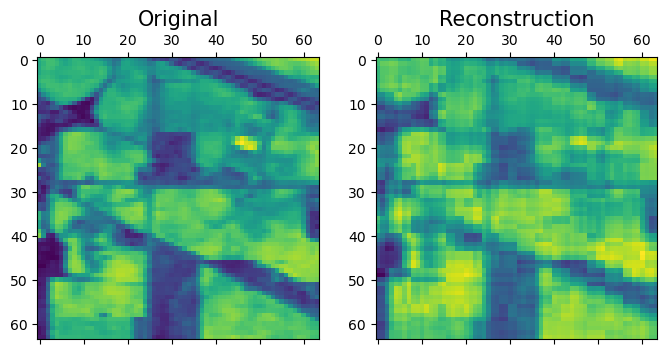

MSE:  0.0016081772338618328
Pearson correlation coefficient:  0.9630296169286048


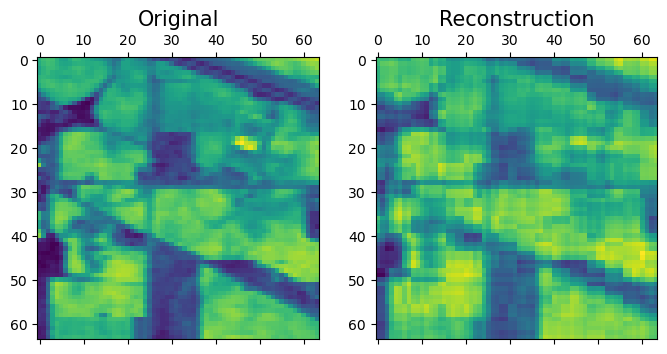

MSE:  0.0016075548453532258
Pearson correlation coefficient:  0.9631550397647739


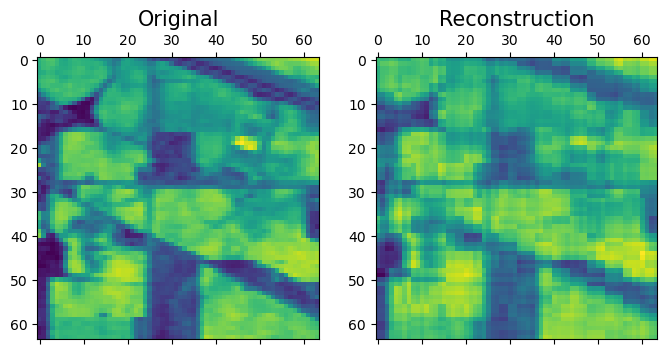

MSE:  0.00160721492771179
Pearson correlation coefficient:  0.9630180574258433


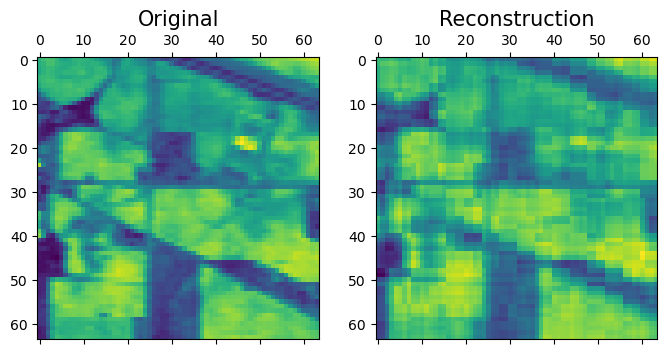

MSE:  0.001606900355703851
Pearson correlation coefficient:  0.9630725150569373


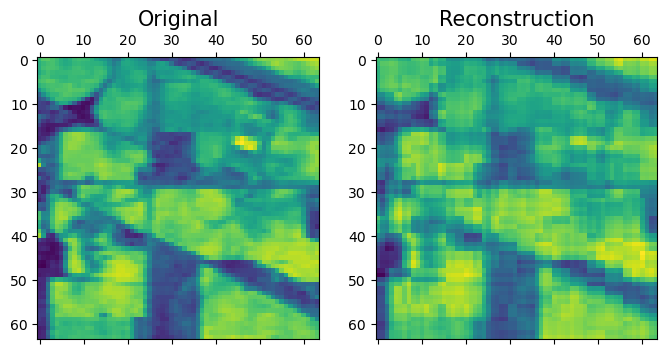

MSE:  0.0016062695977171705
Pearson correlation coefficient:  0.963095237828159


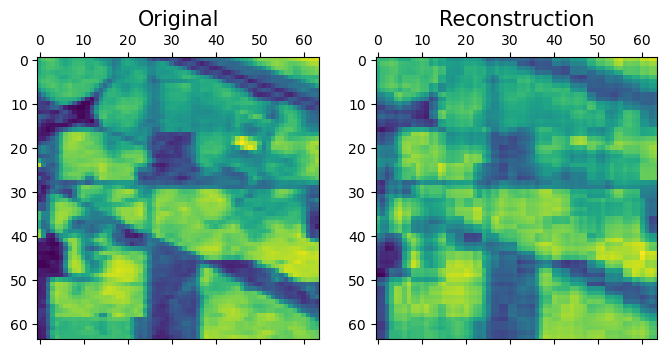

MSE:  0.0016057854599977972
Pearson correlation coefficient:  0.9636511375552935


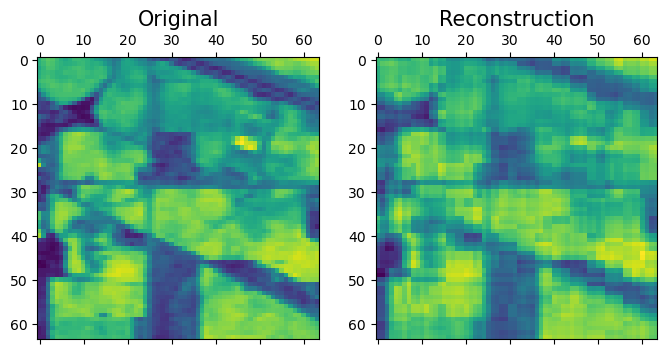

MSE:  0.0016062221750982237
Pearson correlation coefficient:  0.9635319998630133


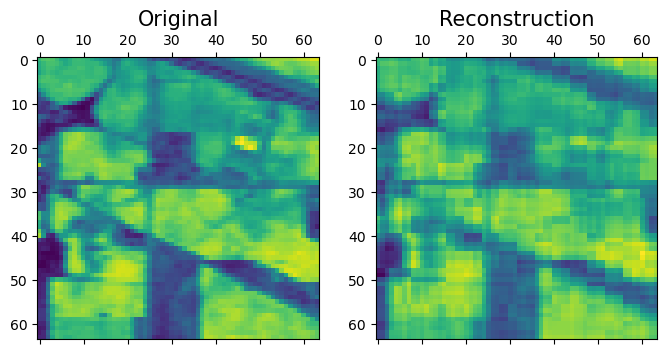

MSE:  0.0016064566183811703
Pearson correlation coefficient:  0.9633991437982328


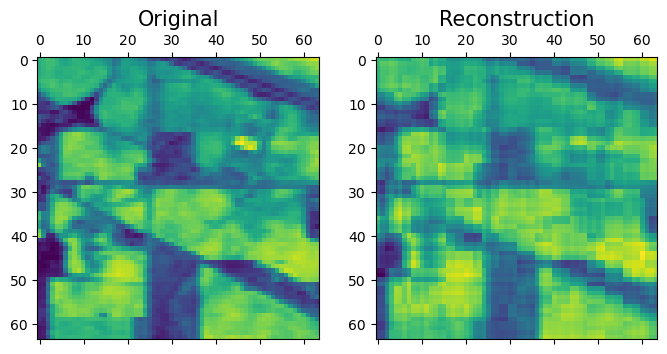

MSE:  0.0016060221364498962
Pearson correlation coefficient:  0.963873420075717


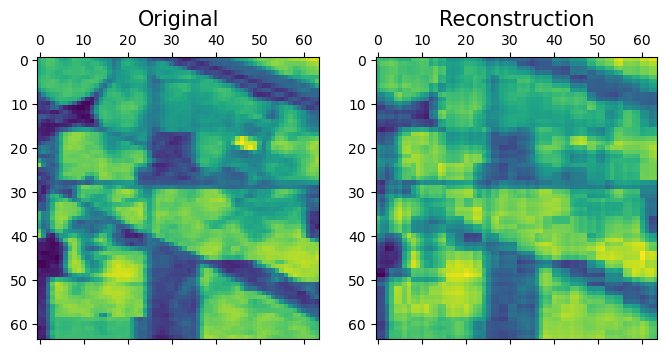

MSE:  0.0016055530118911287
Pearson correlation coefficient:  0.9633468502258606


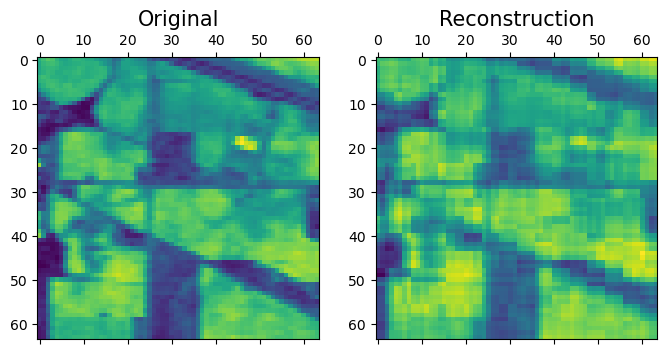

MSE:  0.0016051037773367825
Pearson correlation coefficient:  0.9628753654447832


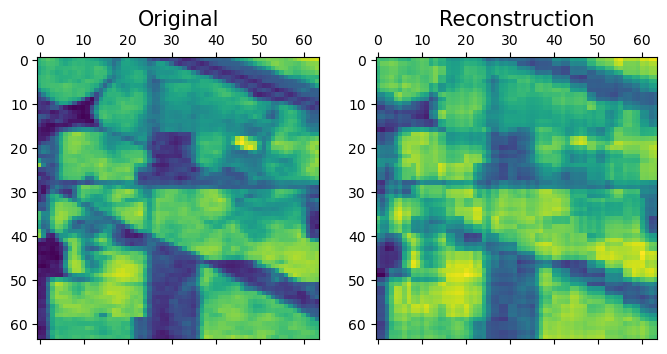

MSE:  0.0016048983387842192
Pearson correlation coefficient:  0.9631958492450872


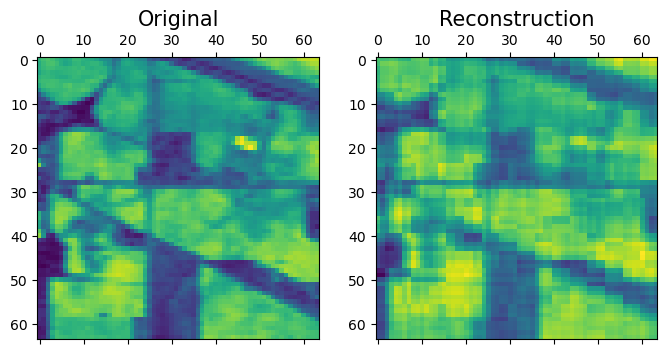

MSE:  0.0016048244337976253
Pearson correlation coefficient:  0.96230349086738


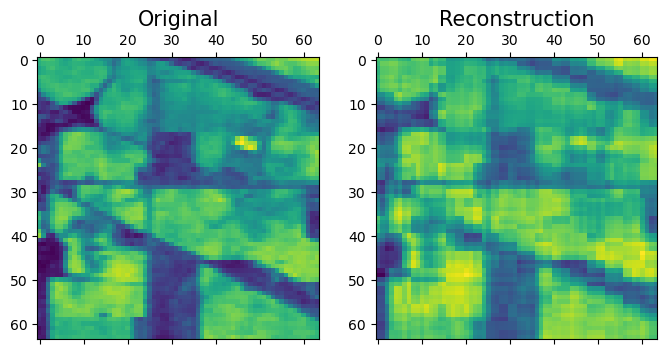

MSE:  0.0016046615277777244
Pearson correlation coefficient:  0.9622056995331134


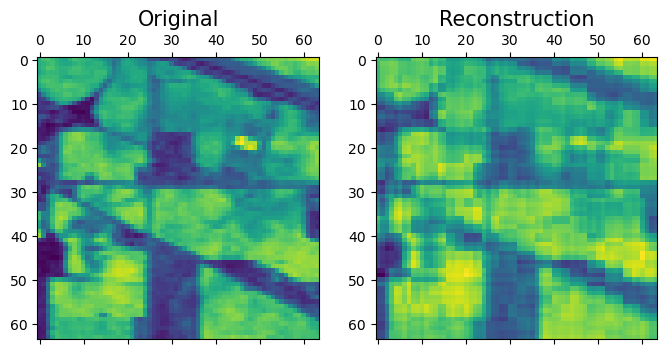

MSE:  0.0016041042658514622
Pearson correlation coefficient:  0.9621628350291027


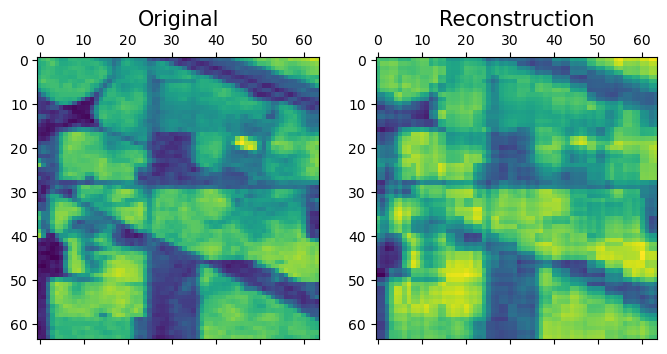

MSE:  0.0016042000382579386
Pearson correlation coefficient:  0.9617092788843782


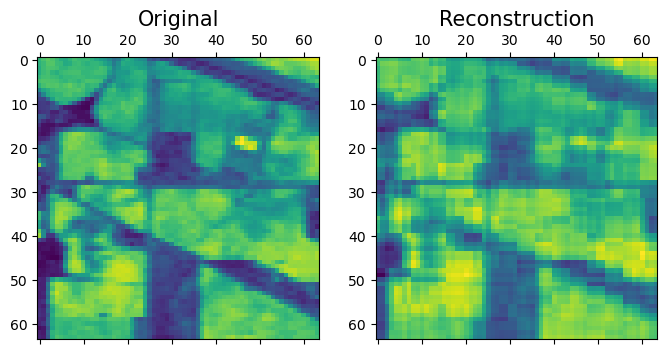

MSE:  0.0016041253683604423
Pearson correlation coefficient:  0.962170879017455


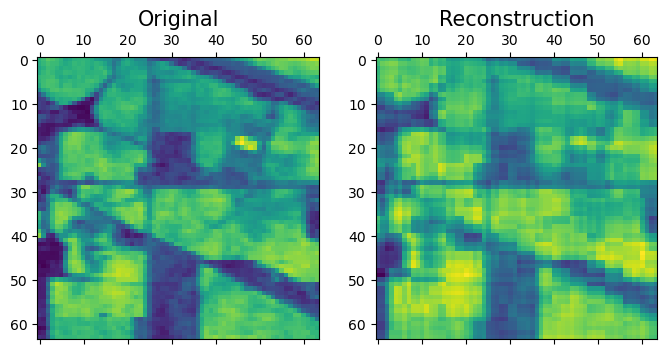

MSE:  0.0016035312411024644
Pearson correlation coefficient:  0.9611591245183169


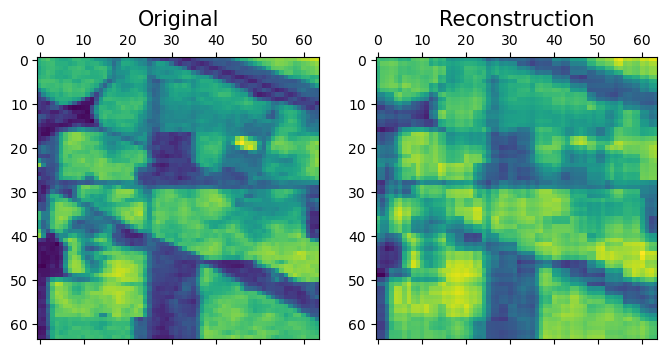

MSE:  0.0016035776238451972
Pearson correlation coefficient:  0.9609523024116208


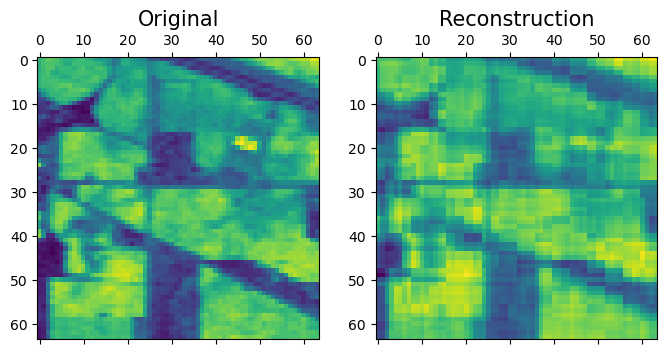

MSE:  0.001602832251146476
Pearson correlation coefficient:  0.9611068039376527


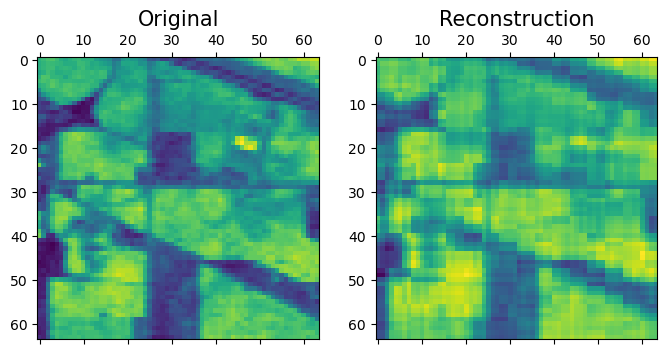

MSE:  0.0016023190618089465
Pearson correlation coefficient:  0.9608516741302583


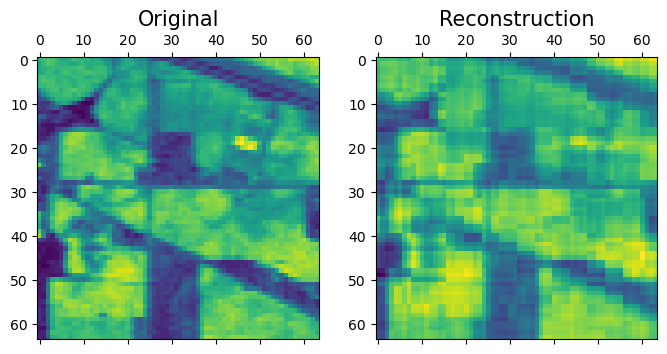

MSE:  0.0016024065288831723
Pearson correlation coefficient:  0.9605931650831312


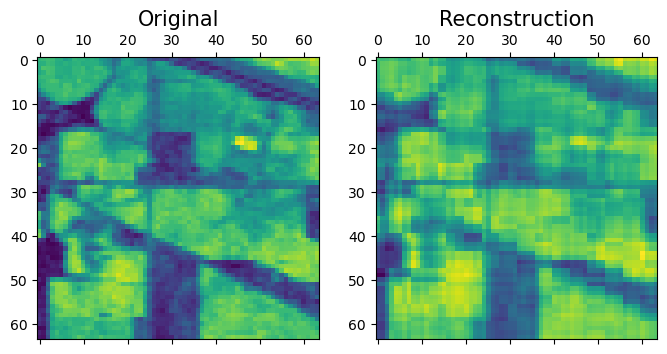

MSE:  0.0016017844653758515
Pearson correlation coefficient:  0.9597326145083436


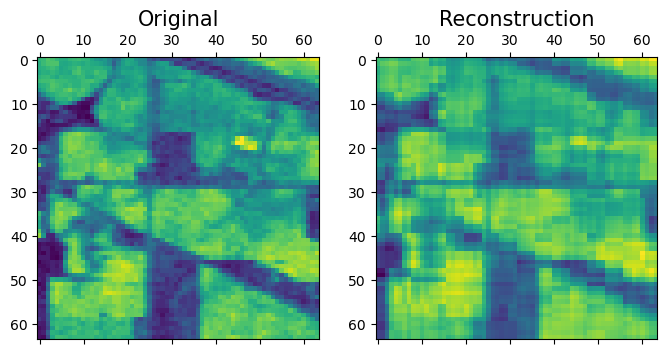

MSE:  0.0016015381395802358
Pearson correlation coefficient:  0.9587340464404546


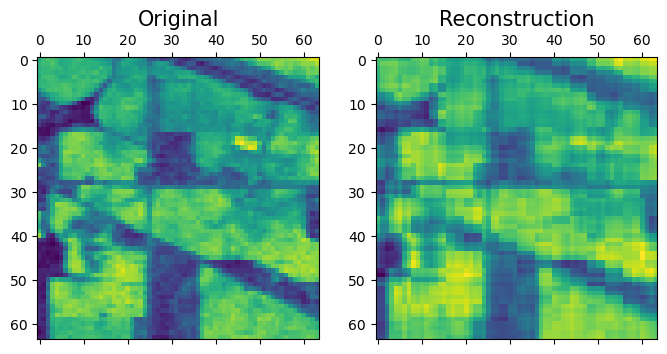

MSE:  0.001601608022496986
Pearson correlation coefficient:  0.9583004669000263


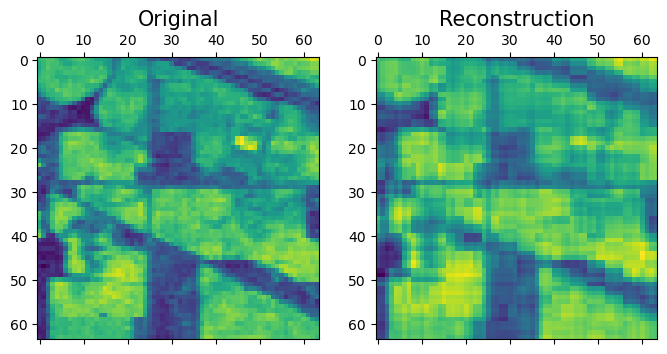

MSE:  0.0016015814056128254
Pearson correlation coefficient:  0.9570270355864435


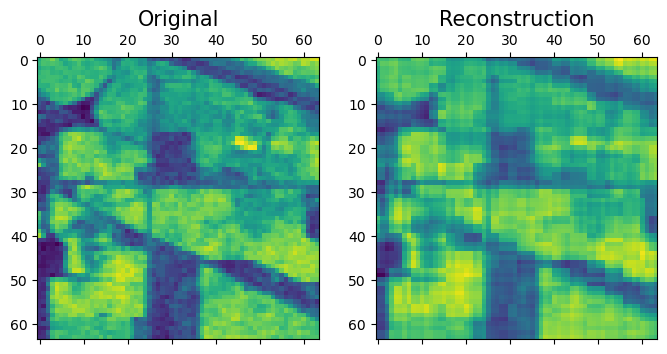

MSE:  0.0016010990494778562
Pearson correlation coefficient:  0.9542047193041636


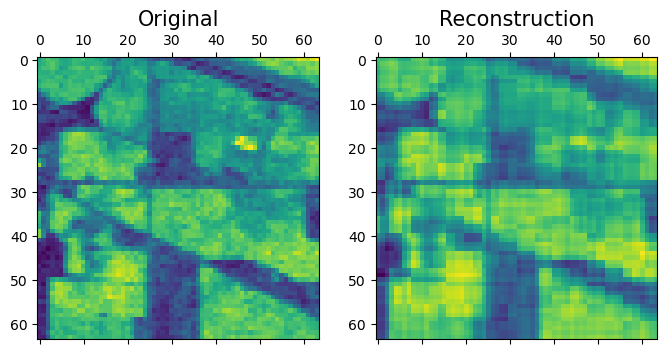

MSE:  0.0016010946564144488
Pearson correlation coefficient:  0.9528612082261467


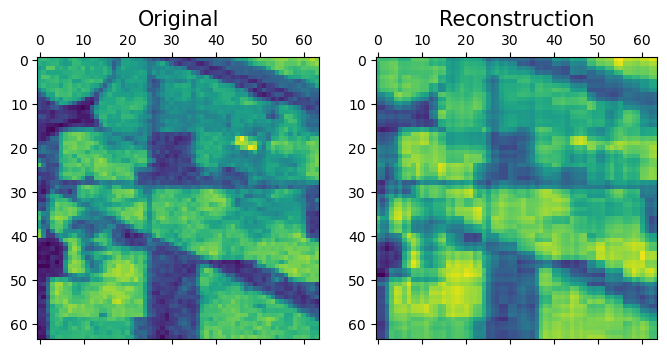

MSE:  0.0016012520831789339
Pearson correlation coefficient:  0.9537977512472766


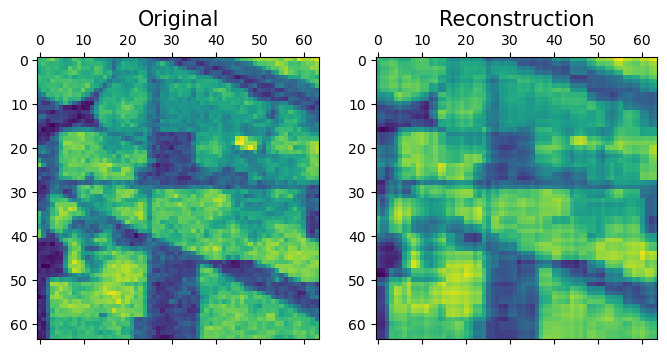

MSE:  0.0016009869976641397
Pearson correlation coefficient:  0.9488626833495171


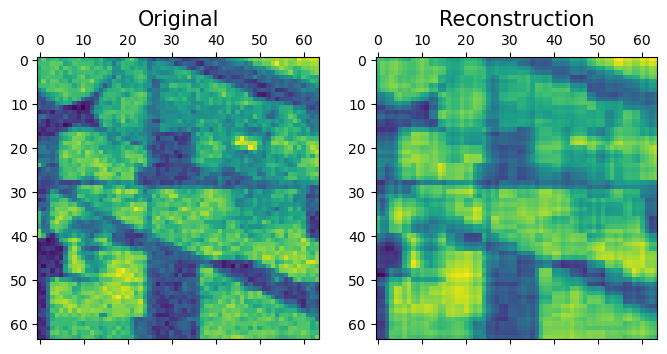

MSE:  0.0016006569192355295
Pearson correlation coefficient:  0.9409559242379777


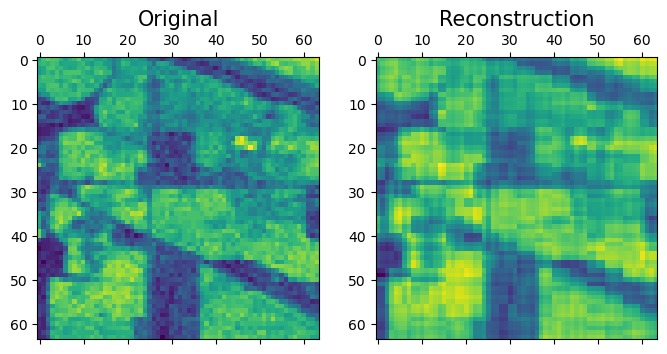

MSE:  0.0016008211845933683
Pearson correlation coefficient:  0.9431767680218778


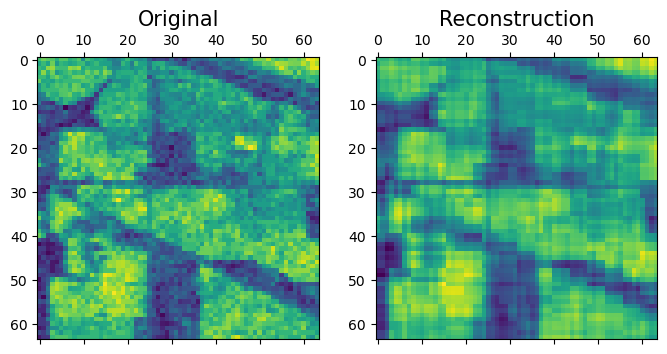

MSE:  0.00160057303417164
Pearson correlation coefficient:  0.9281486810853665


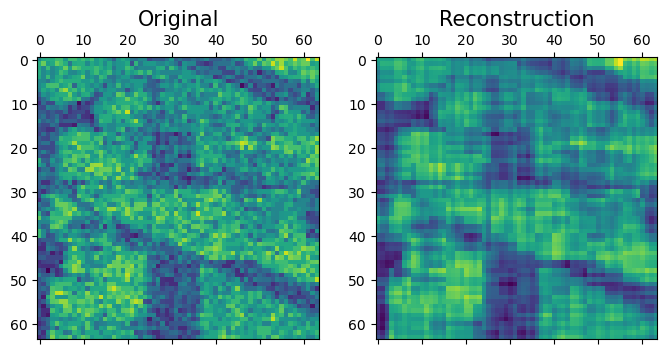

MSE:  0.0016003283089347474
Pearson correlation coefficient:  0.8555301411078609


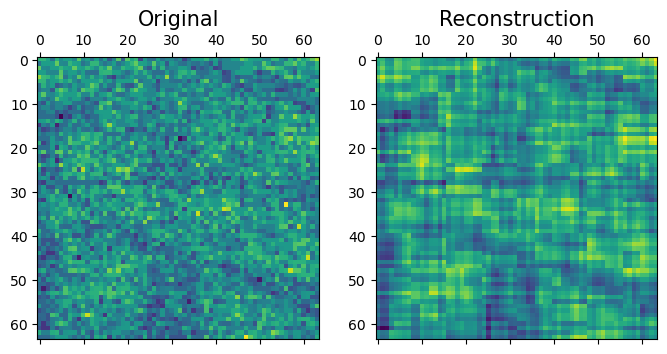

MSE:  0.0016002970898996568
Pearson correlation coefficient:  0.663321111604986


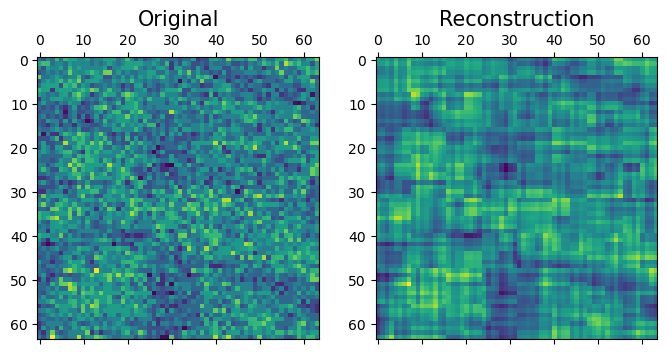

MSE:  0.0016002664609080714
Pearson correlation coefficient:  0.6464284966572389


In [108]:
for i in range(final.shape[2]):
    show([img[:,:,i],final[:,:,i]], ["Original","Reconstruction"], columns = 2)
    MSE(img[:,:,i],final[:,:,i], True)
    print("Pearson correlation coefficient: ", measure.pearson_corr_coeff(img[:,:,i],final[:,:,i], mask=None)[0])

In [97]:
import spectral.io.envi as envi
envi.save_image('reconstruction_final.hdr', final, dtype=np.float32, force=True)

For a compression of 25%, we can analyze now each layer. Overall, the reconstruction had a great result. The layers that get the worst results are often the ones with more noise and where patterns don't exist. We can also spot some layers with small features (1 or 2 pixels) that tend to disappear, so this tecnique might not be apporpriate if we want to spot details. 